# Image-Based Table Extraction using Multi-Type-TD-TSR
## 1. Install all the prerequisite

In [ ]:
!pip install pytesseract

In [ ]:
!sudo apt install tesseract-ocr

In [ ]:
!pip install pdf2image

In [ ]:
!apt-get install poppler-utils

In [ ]:
# install dependencies: 
!pip install pyyaml==5.1
!pip install torch==1.7
!pip install torchvision==0.8.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version

import torch, torchvision
torch.__version__
assert torch.__version__.startswith("1.7")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html
# exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

## 2. Clone the repository

In [ ]:
!git clone https://github.com/Psarpei/Multi-Type-TD-TSR.git
!mv Multi-Type-TD-TSR/ Multi_Type_TD_TSR

## 3. Download Table Detection Weights and Configuration File

In [ ]:
!gdown --id 11FgFTy0MyVUMGd00T_InEDaarB4qAlP8
!gdown --id 1WBk6kHHyvyEzoPBsRr2BvFY51zURjd4R
!gdown --id 1PfA2uws919gc893-x9uMIz06zWEko8nF 

## 4. Import relevant packages

In [1]:
import os
from io import BytesIO
from PIL import Image
import pytesseract
import gc
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import csv
from pdf2image import convert_from_path, convert_from_bytes
from IPython.display import display, Image
import requests

In [ ]:
import detectron2
import Multi_Type_TD_TSR.google_colab.deskew as deskew
import Multi_Type_TD_TSR.google_colab.table_detection as table_detection
import Multi_Type_TD_TSR.google_colab.table_structure_recognition_all as tsra
import Multi_Type_TD_TSR.google_colab.table_structure_recognition_lines as tsrl
import Multi_Type_TD_TSR.google_colab.table_structure_recognition_wol as tsrwol
import Multi_Type_TD_TSR.google_colab.table_structure_recognition_lines_wol as tsrlwol
import Multi_Type_TD_TSR.google_colab.table_xml as txml
import Multi_Type_TD_TSR.google_colab.table_ocr as tocr
import json
import itertools
import random
from detectron2.utils.logger import setup_logger

# import common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data import DatasetCatalog, MetadataCatalog
from google.colab.patches import cv2_imshow
setup_logger()

## 5. Initialize Table Detection Detector

In [ ]:
#create detectron config
cfg = get_cfg()

#set yaml
cfg.merge_from_file('/content/All_X152.yaml')

#set model weights
cfg.MODEL.WEIGHTS = '/content/model_final.pth' # Set path model .pth

predictor = DefaultPredictor(cfg) 

## 6. Table Detection from PDF report

In [11]:
def table_extraction(url, copy_to_path):

  # check if URL is pdf
  if not url.endswith("pdf"):
    print("URL is not a PDF.")
    return

  try:
    response = requests.get(url)
  except:
    print("Requests failed.")
    return

  # convert pdf URL to image
  images = convert_from_bytes(response.content, size=1000)
  pdf_img = []
  for pil_img in images:
    cv2_img = cv2.cvtColor(np.array(pil_img), cv2.COLOR_RGB2BGR)
    pdf_img.append(cv2_img)

  i = 1

  # dictionary of keywords
  dictionary = ['direct ghg emissions', 'indirect ghg emissions', 'scope 1', 'scope 2', 'scope 3', 'energy consumption', 'paper consumption', 'water consumption', 'carbon intensity', 'waste management']

  for file in pdf_img:
    #table_detection.plot_prediction(document_img, predictor)
    table_list, table_coords = table_detection.make_prediction(file, predictor)
      
    for coord in table_coords:
      #print(coord)
      y = coord[1]
      x = coord[0]
      h = coord[3]
      w = coord[2]

      # extract detected table by coordinates
      img = file[y:y+h, x:x+w]
      scale_percent = 150 # percent of original size
      width = int(img.shape[1] * scale_percent / 100)
      height = int(img.shape[0] * scale_percent / 100)
      dim = (width, height)
    
      # resize image
      resized = cv2.resize(img, dim)
      #cv2_imshow(resized)
      text = pytesseract.image_to_string(resized)
      #print(text)

      # if any keyword found in text in table, save image into output folder
      if any(keyword in text.lower() for keyword in dictionary):
        print("----------------------------------------------------------------------------------------------------------")
        print("RELEVANT IMAGE FOUND!")
        cv2_imshow(resized)
        print("----------------------------------------------------------------------------------------------------------")

        cv2.imwrite(copy_to_path+"IMAGE_"+str(i)+".jpg", img)
        i += 1

In [10]:
# create destination folder to store extracted images
!mkdir output_images_chbank

TABLE 0 :


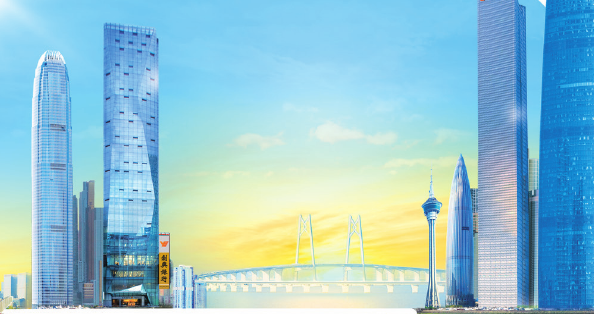


TABLE 0 :


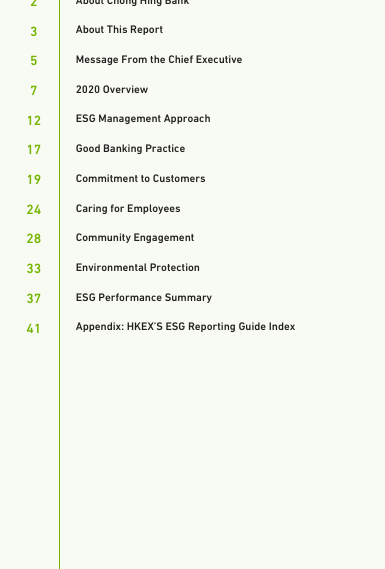


TABLE 0 :


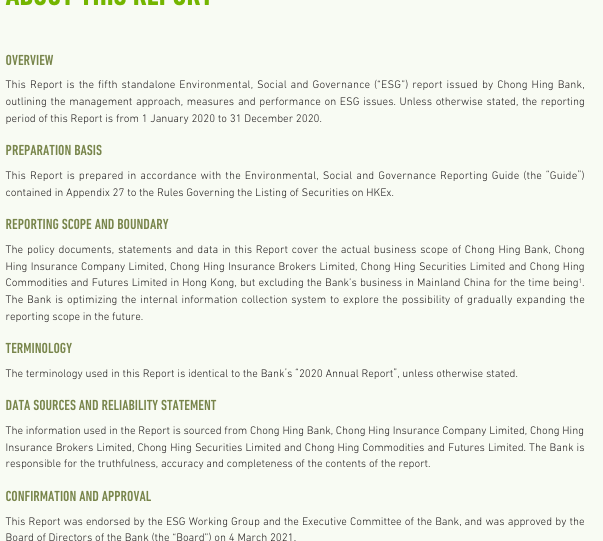


TABLE 0 :


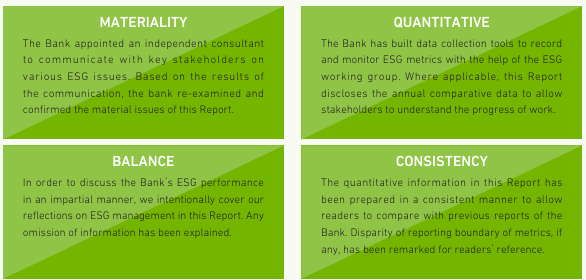


TABLE 1 :


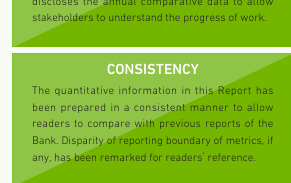


TABLE 2 :


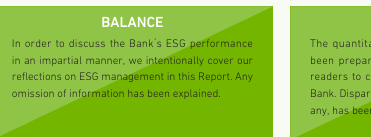


TABLE 0 :


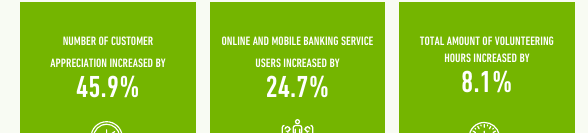


TABLE 0 :


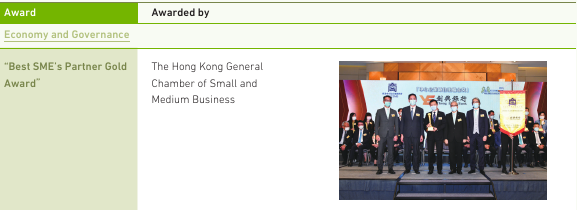


TABLE 1 :


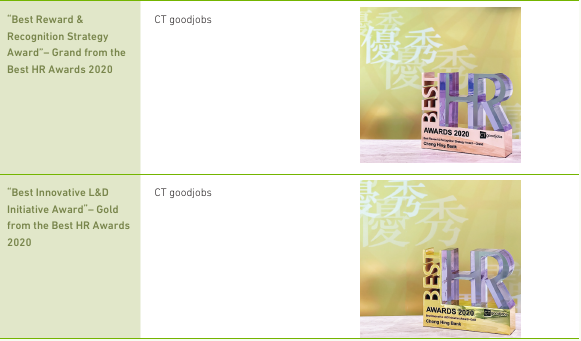


TABLE 0 :


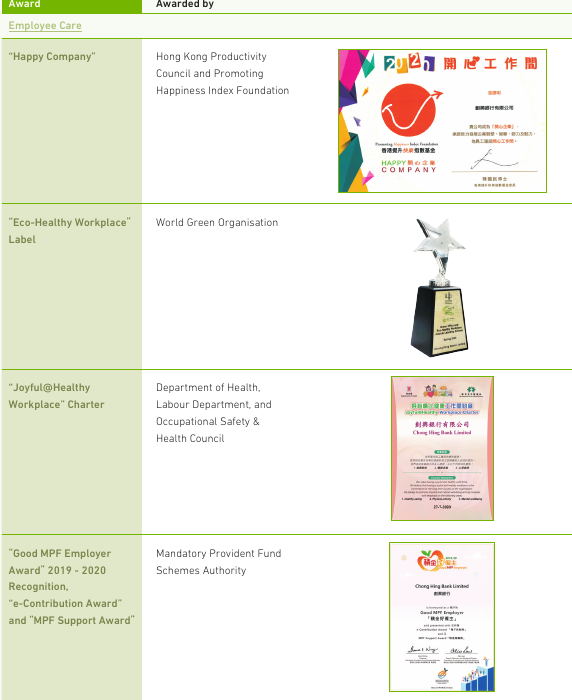


TABLE 1 :


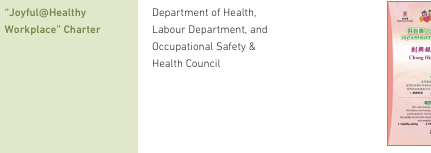


TABLE 2 :


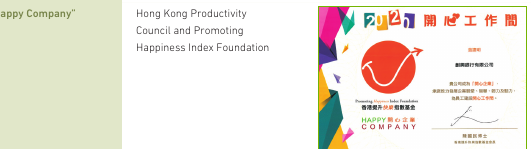


TABLE 0 :


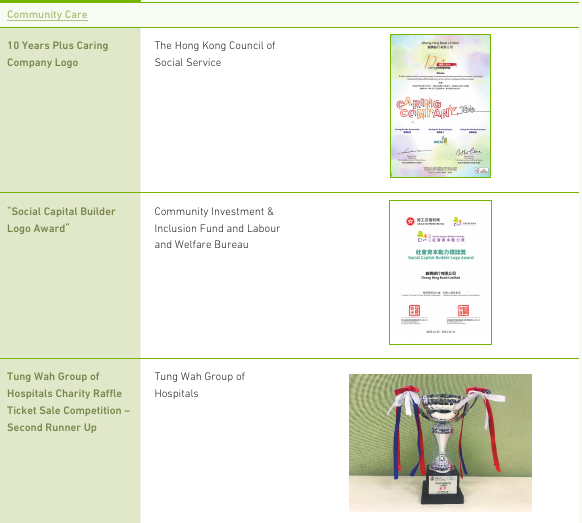


TABLE 0 :


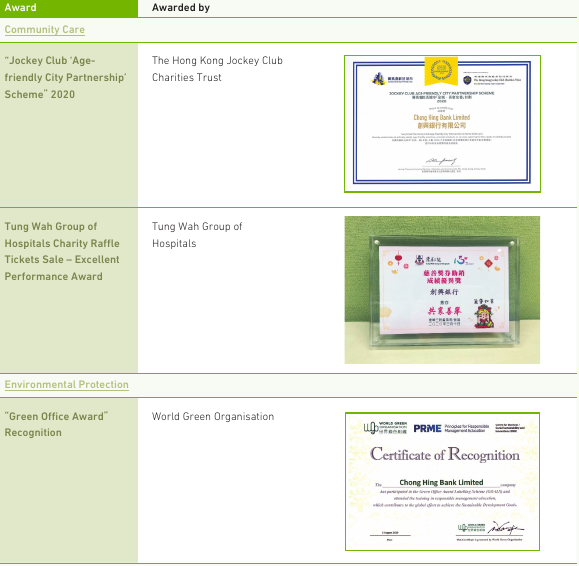


TABLE 1 :


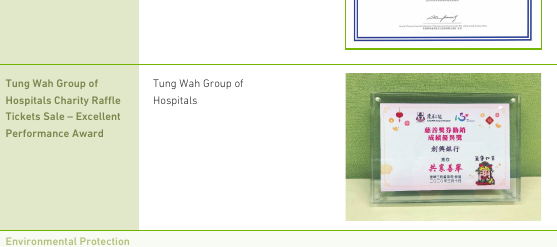


TABLE 0 :


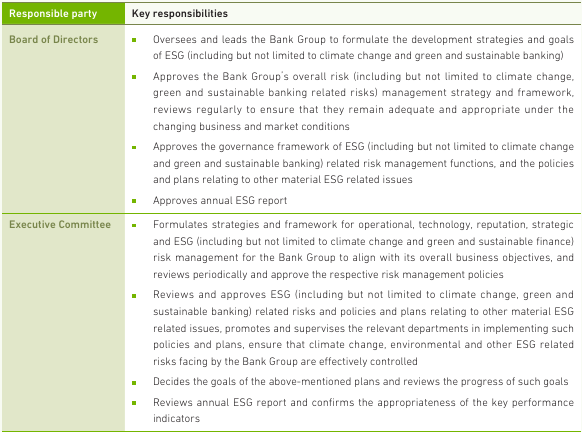


TABLE 0 :


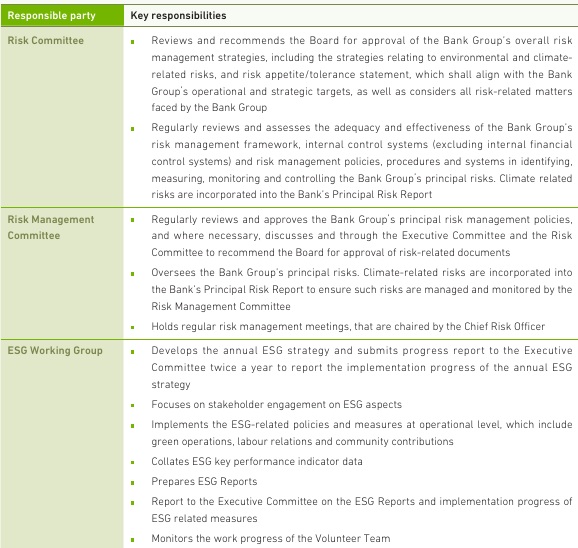


TABLE 0 :


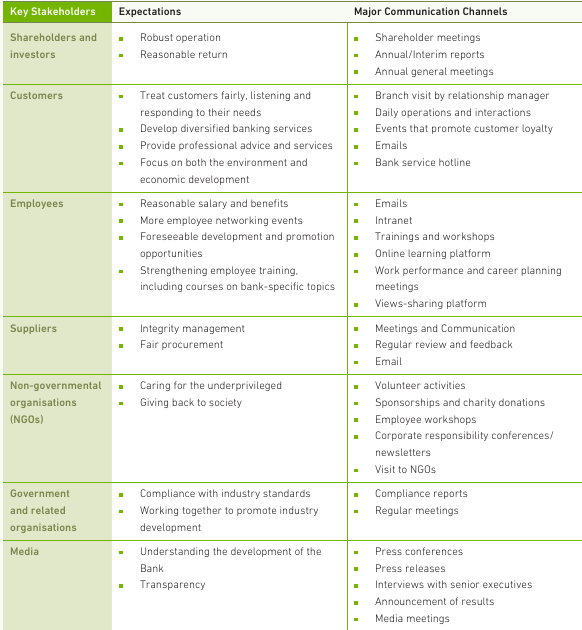


TABLE 0 :


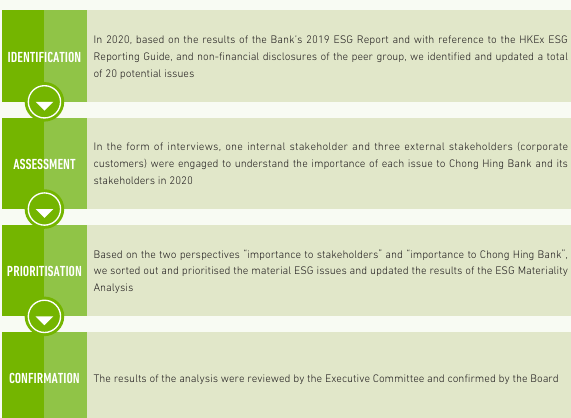


TABLE 1 :


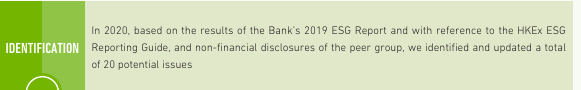


TABLE 2 :


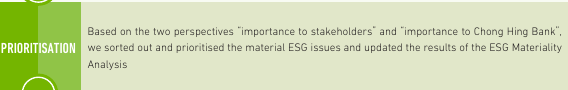


TABLE 3 :


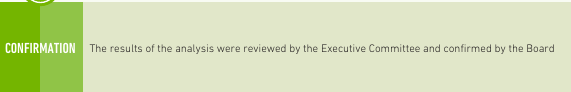


TABLE 4 :


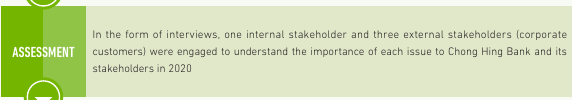


TABLE 5 :


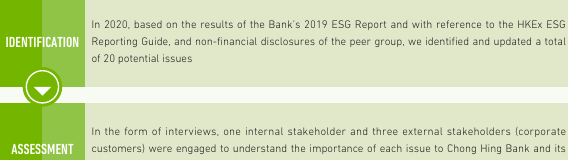


TABLE 0 :


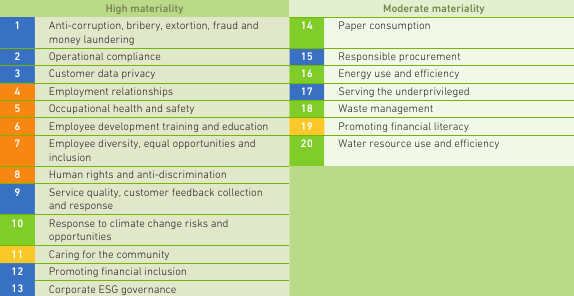


TABLE 1 :


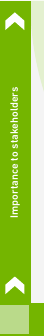


----------------------------------------------------------------------------------------------------------
RELEVANT IMAGE FOUND!


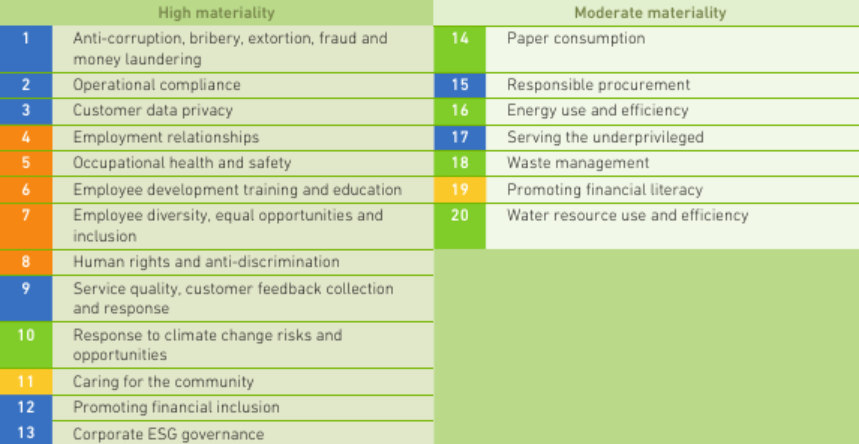

----------------------------------------------------------------------------------------------------------
TABLE 0 :


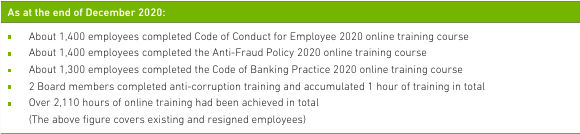


TABLE 0 :


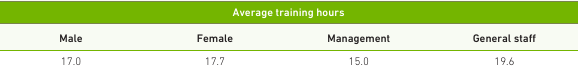


TABLE 0 :


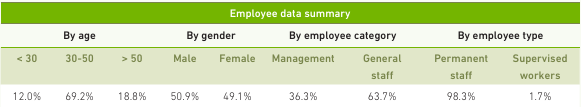


TABLE 0 :


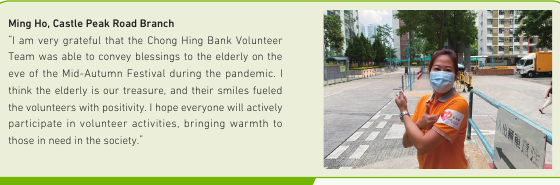


TABLE 1 :


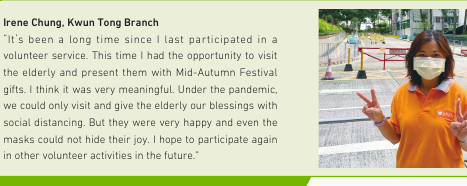


TABLE 0 :


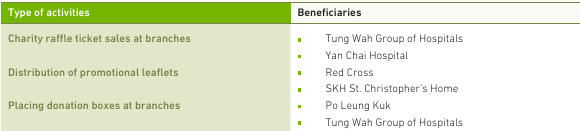


TABLE 0 :


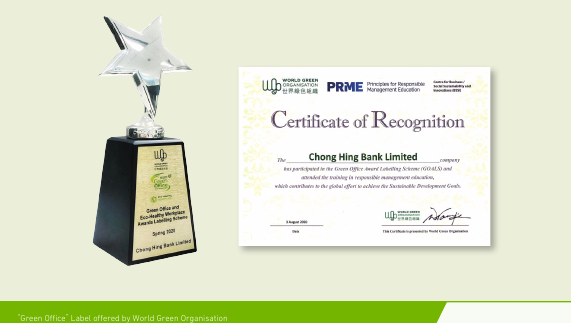


TABLE 1 :


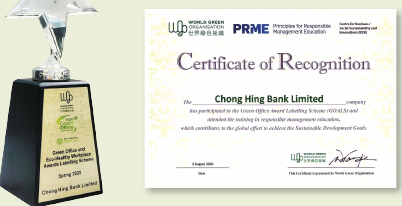


TABLE 0 :


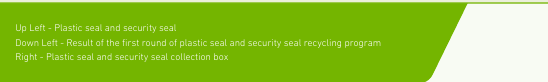


TABLE 0 :


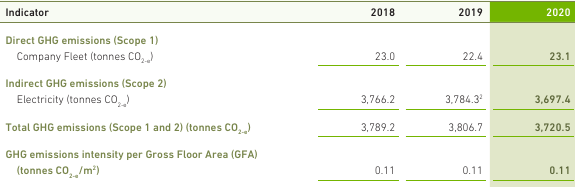


TABLE 1 :


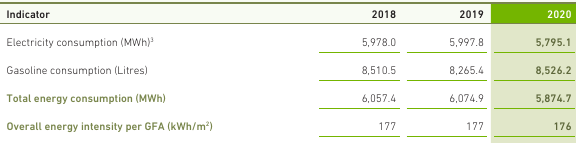


TABLE 2 :


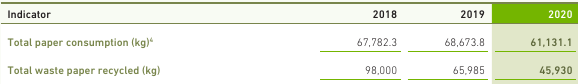


TABLE 3 :


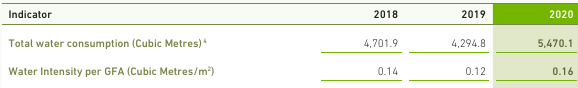


TABLE 4 :


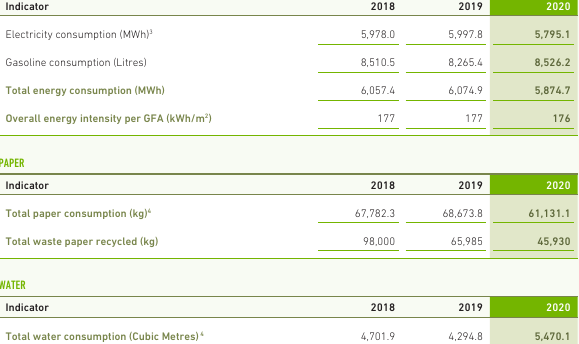


TABLE 5 :


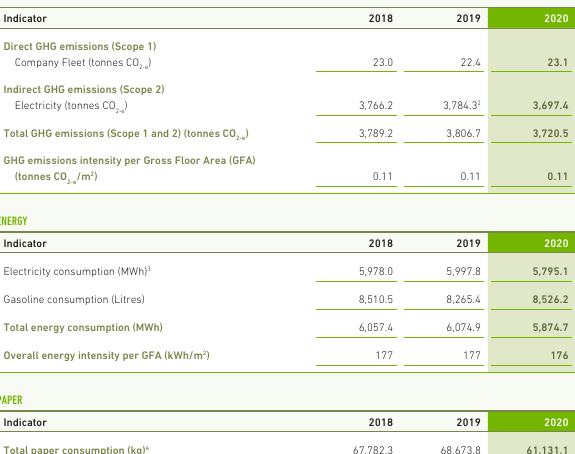


----------------------------------------------------------------------------------------------------------
RELEVANT IMAGE FOUND!


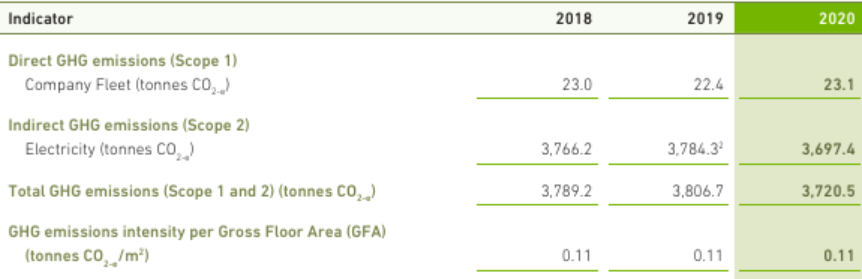

----------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------
RELEVANT IMAGE FOUND!


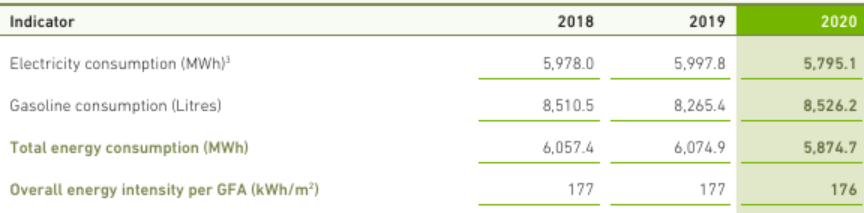

----------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------
RELEVANT IMAGE FOUND!


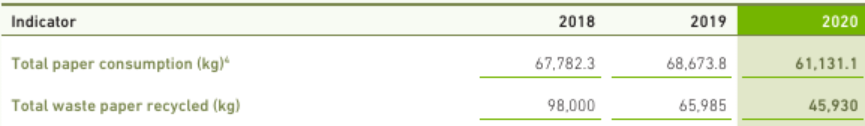

----------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------
RELEVANT IMAGE FOUND!


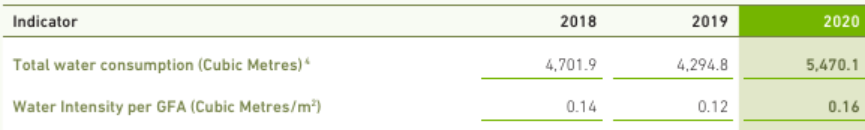

----------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------
RELEVANT IMAGE FOUND!


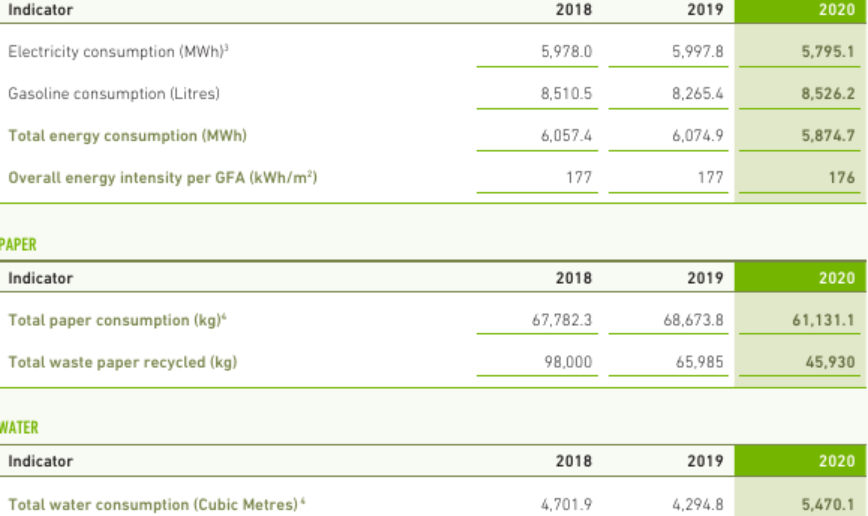

----------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------
RELEVANT IMAGE FOUND!


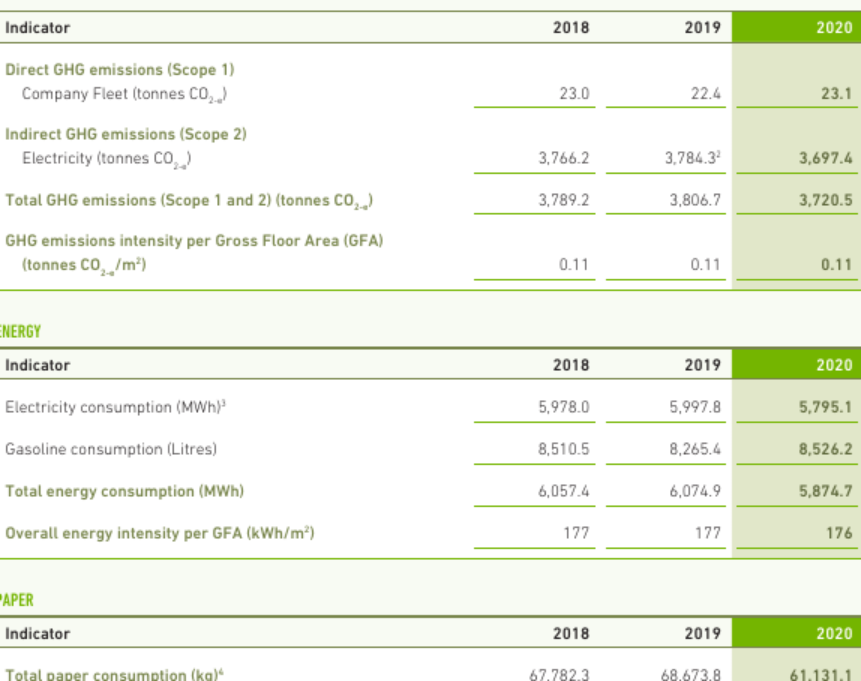

----------------------------------------------------------------------------------------------------------
TABLE 0 :


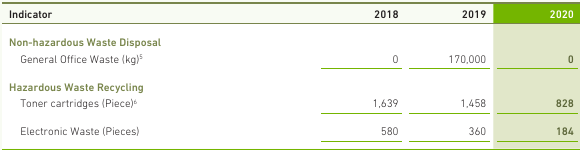


TABLE 1 :


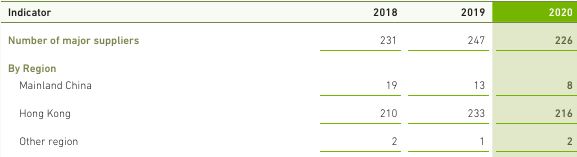


TABLE 2 :


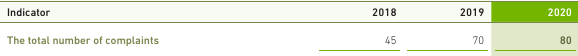


TABLE 0 :


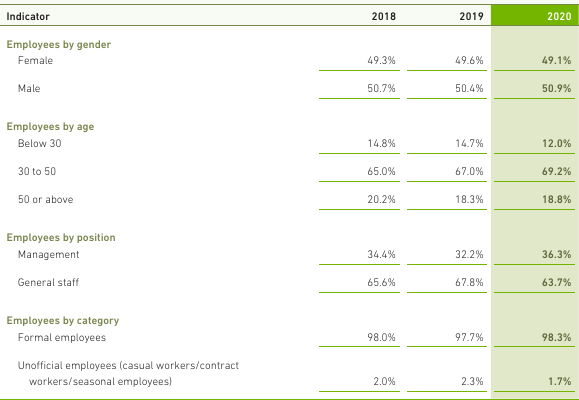


TABLE 1 :


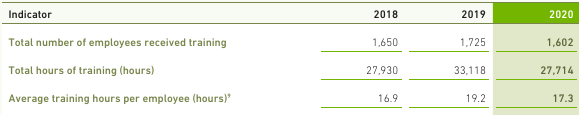


TABLE 0 :


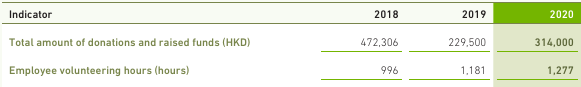


TABLE 0 :


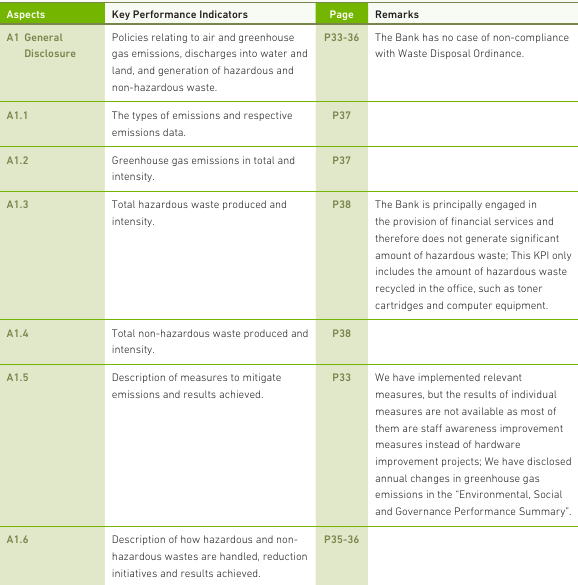


TABLE 0 :


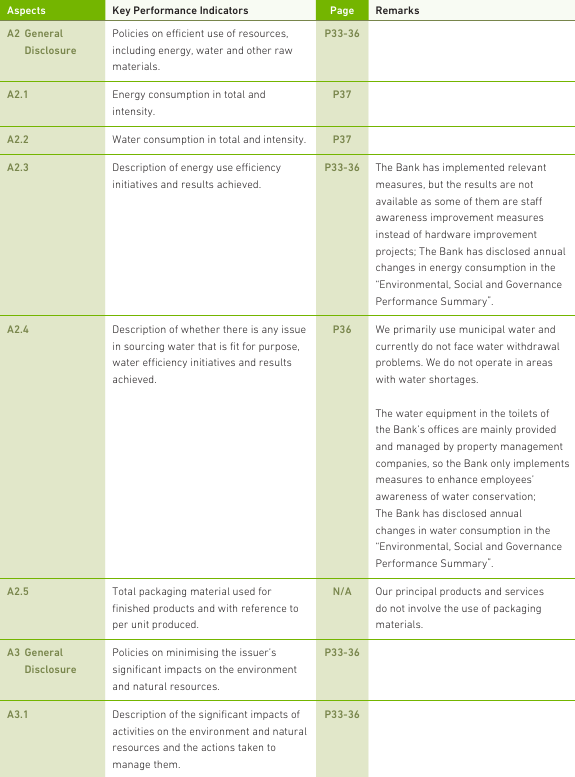


----------------------------------------------------------------------------------------------------------
RELEVANT IMAGE FOUND!


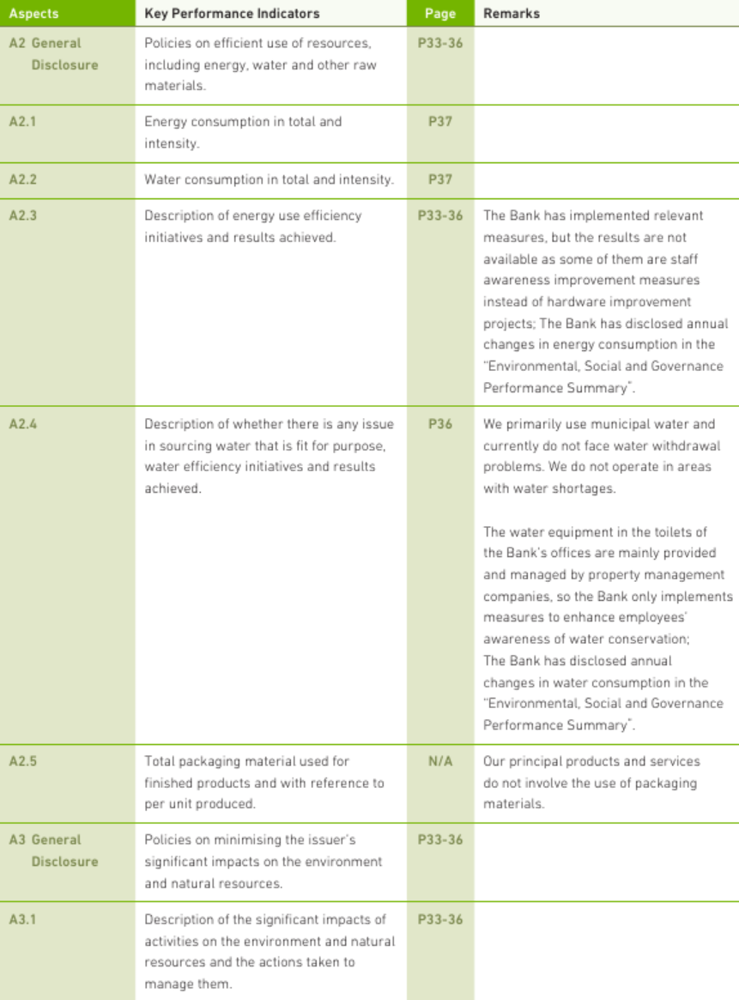

----------------------------------------------------------------------------------------------------------
TABLE 0 :


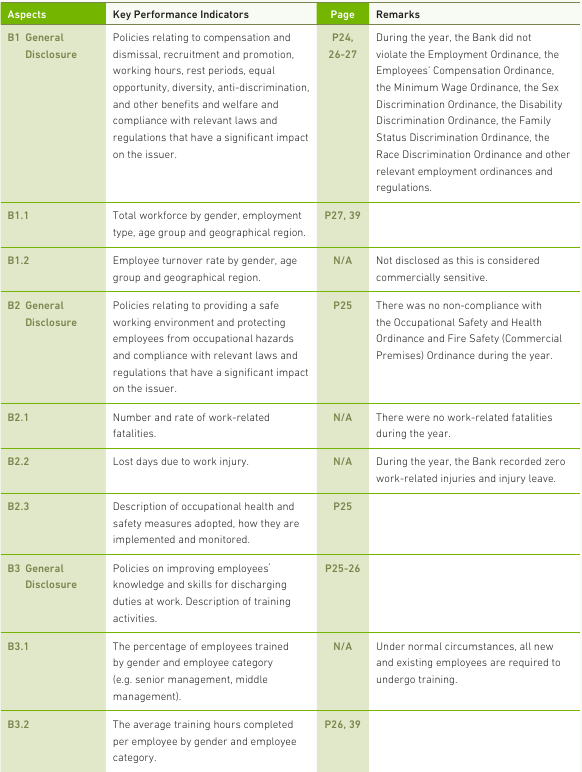


TABLE 0 :


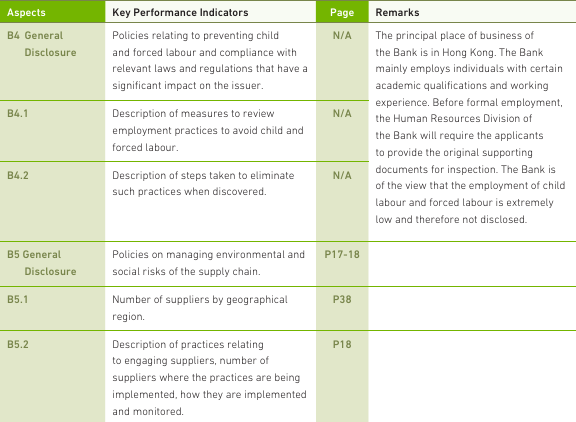


TABLE 0 :


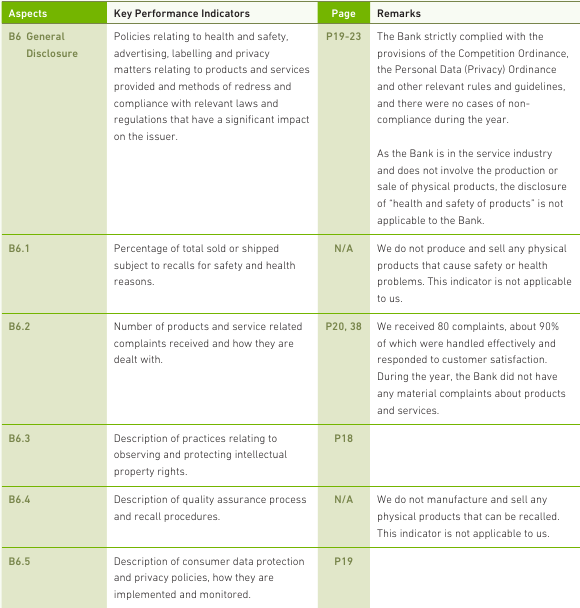


TABLE 0 :


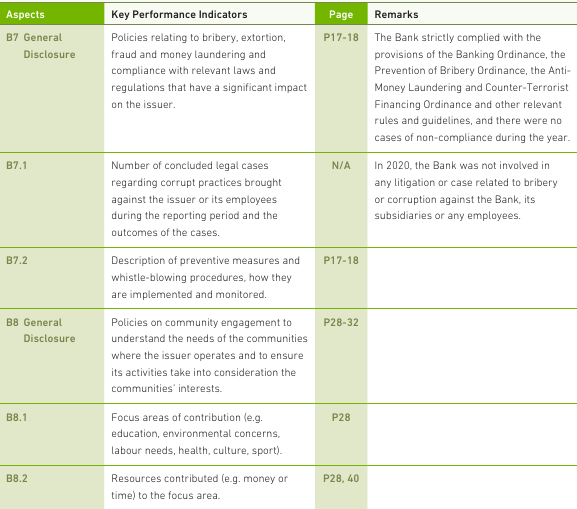

In [12]:
# Input PDF report URL and destination folder path
table_extraction("http://www.chbank.com/en/pdf/2020/esg_report.pdf", "/content/output_images_chbank/")

/usr/local/lib/python3.7/dist-packages/detectron2/modeling/roi_heads/fast_rcnn.py:154: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:882.)
  filter_inds = filter_mask.nonzero()


TABLE 0 :


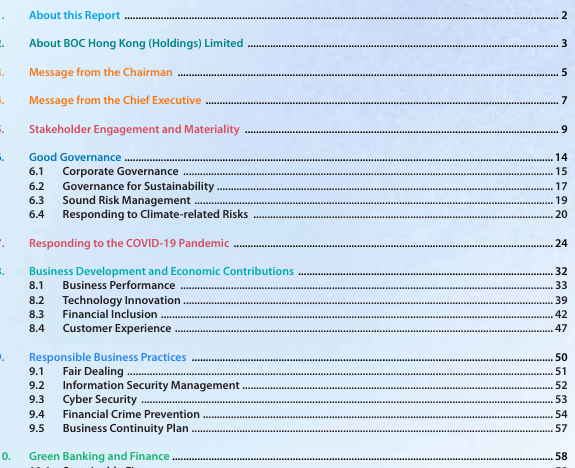


TABLE 0 :


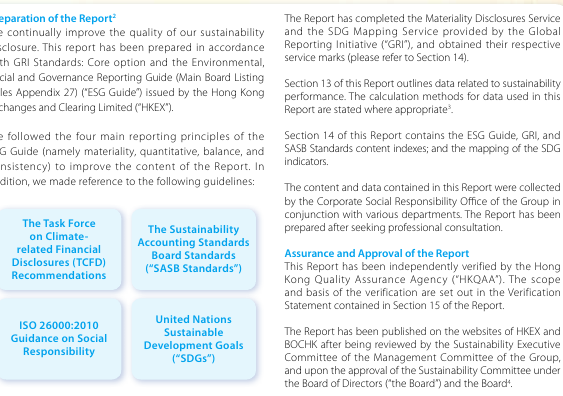


TABLE 0 :


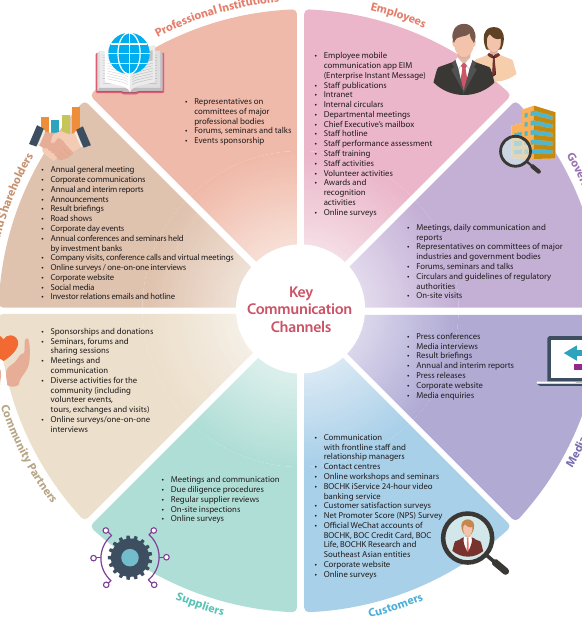


TABLE 0 :


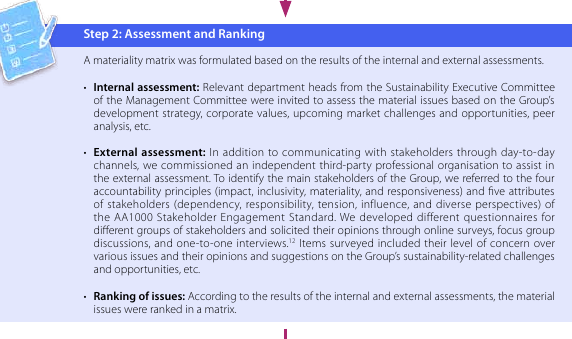


TABLE 1 :


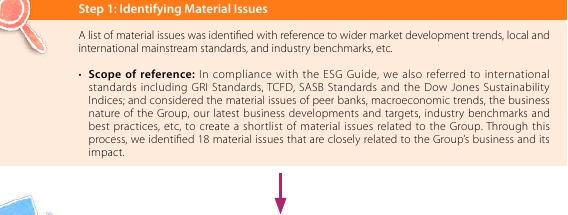


TABLE 0 :


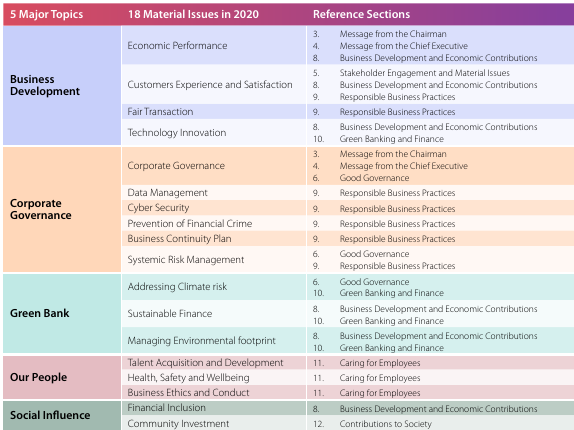


TABLE 1 :


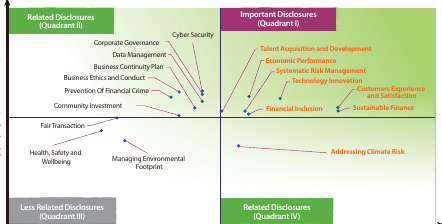


TABLE 0 :


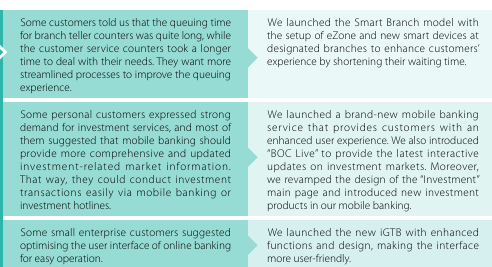


TABLE 1 :


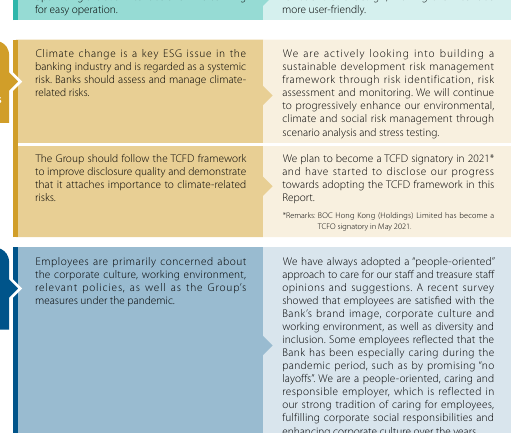


TABLE 2 :


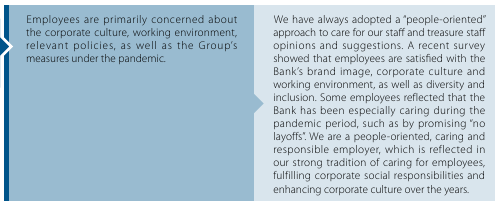


TABLE 0 :


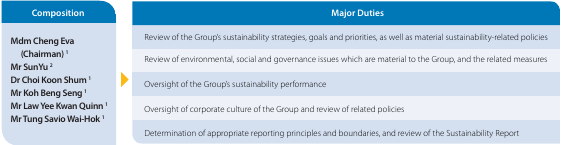


TABLE 1 :


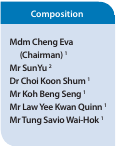


TABLE 0 :


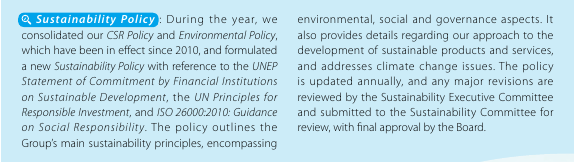


TABLE 0 :


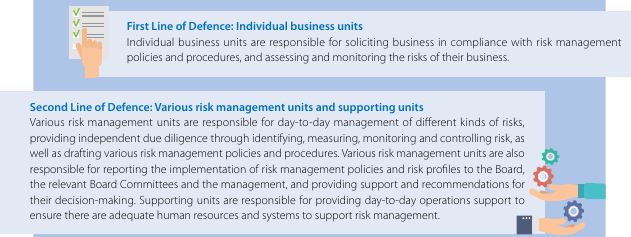


TABLE 0 :


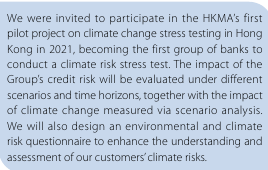


TABLE 0 :


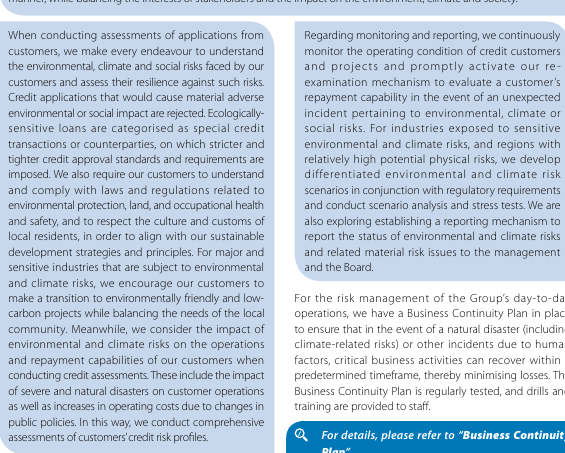


TABLE 1 :


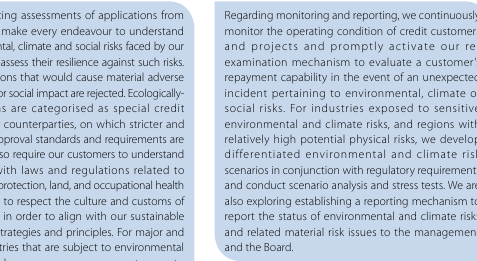


TABLE 0 :


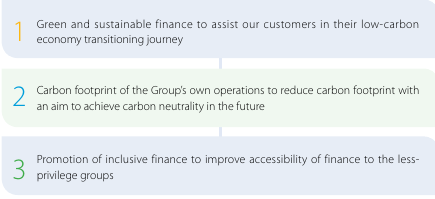


TABLE 1 :


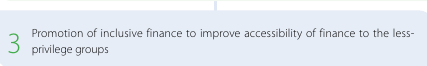


TABLE 0 :


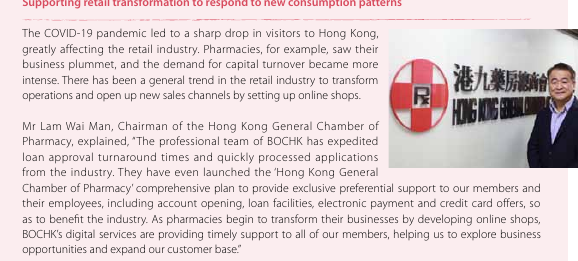


TABLE 0 :


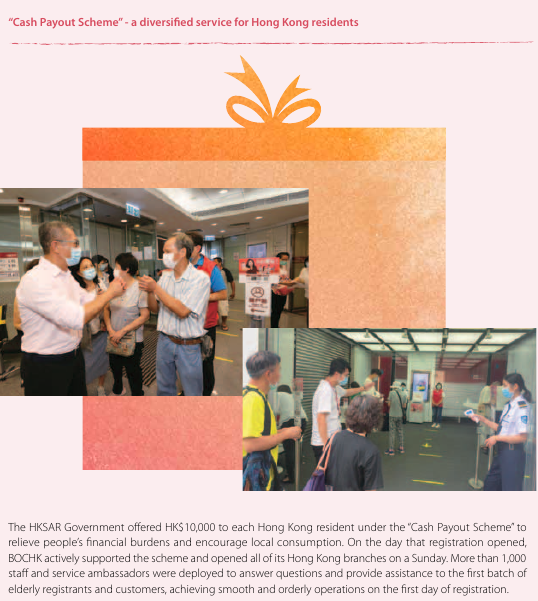


TABLE 0 :


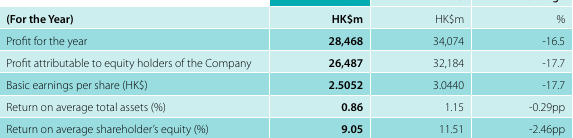


TABLE 1 :


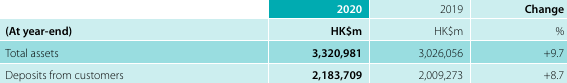


TABLE 2 :


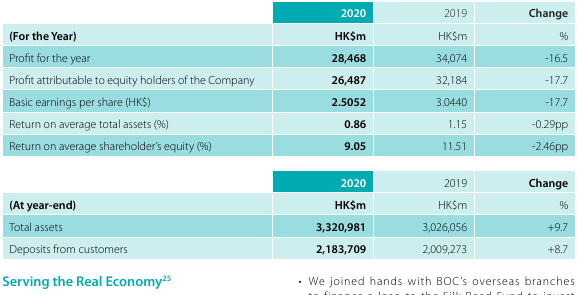


TABLE 0 :


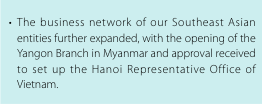


TABLE 1 :


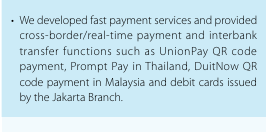


TABLE 2 :


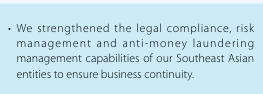


TABLE 3 :


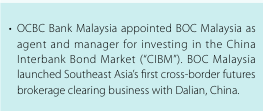


TABLE 4 :


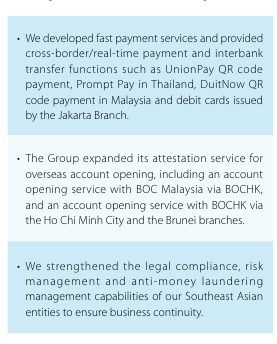


TABLE 5 :


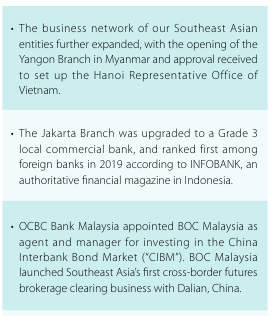


TABLE 0 :


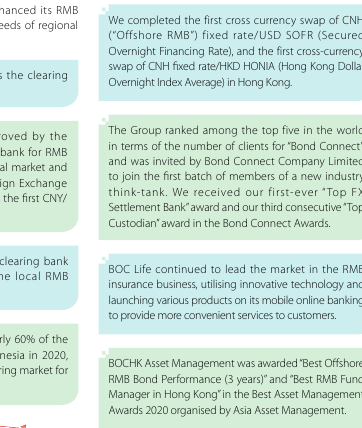


TABLE 1 :


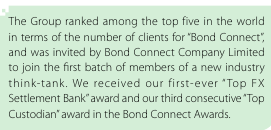


TABLE 2 :


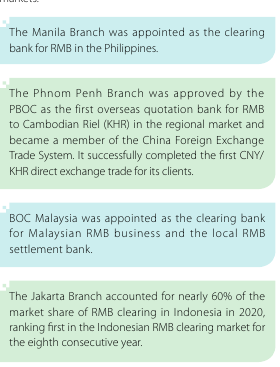


TABLE 3 :


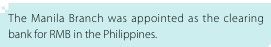


TABLE 4 :


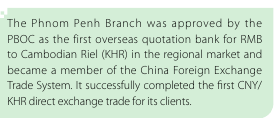


TABLE 5 :


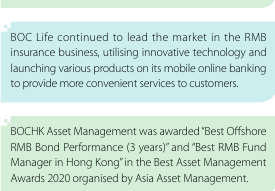


TABLE 0 :


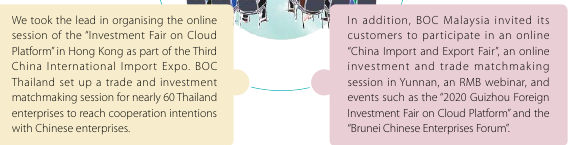


TABLE 1 :


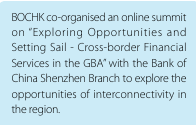


TABLE 2 :


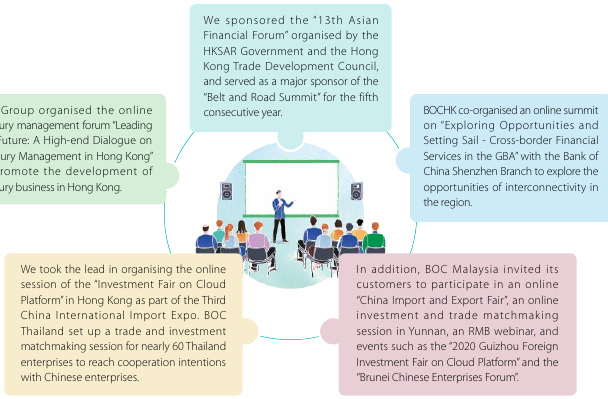


TABLE 3 :


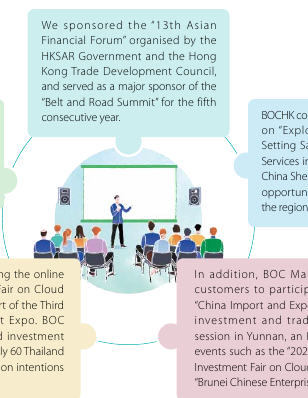


TABLE 4 :


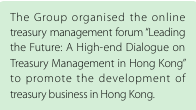


TABLE 0 :


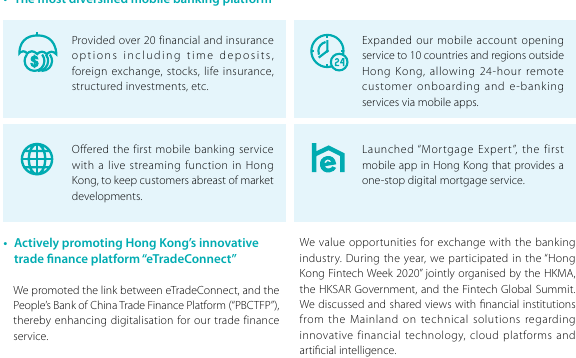


TABLE 1 :


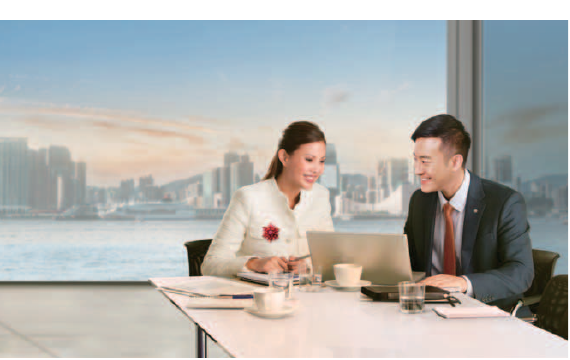


TABLE 0 :


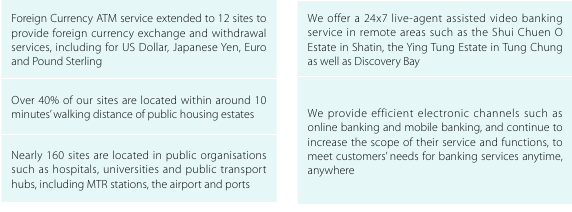


TABLE 0 :


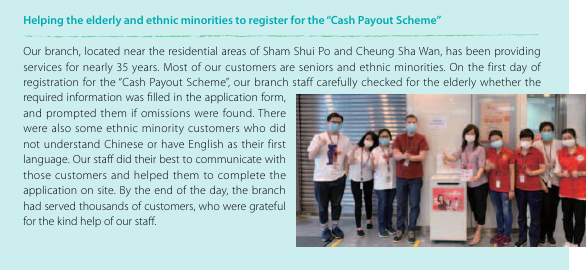


TABLE 0 :


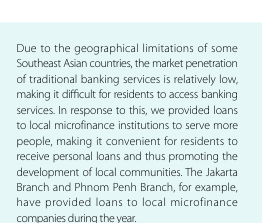


TABLE 1 :


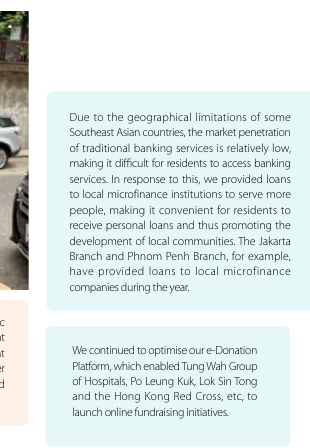


TABLE 2 :


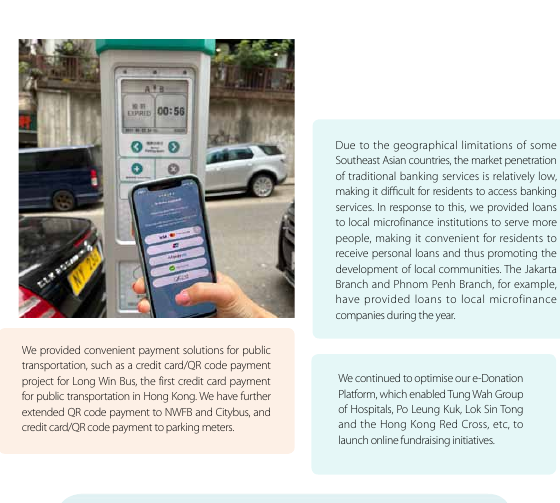


TABLE 0 :


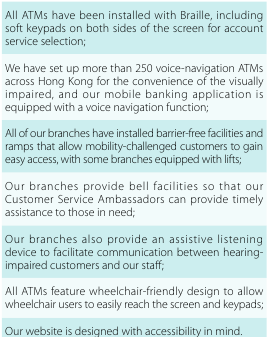


TABLE 0 :


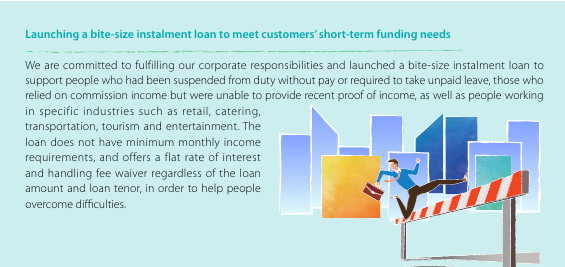


TABLE 1 :


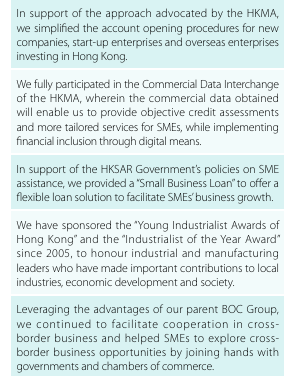


TABLE 0 :


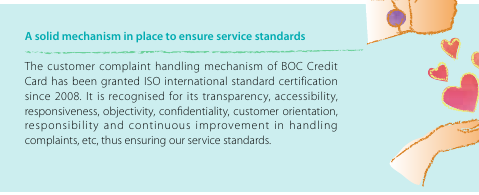


TABLE 1 :


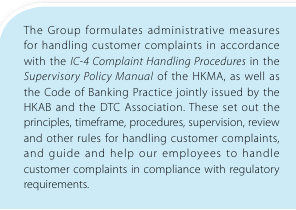


TABLE 0 :


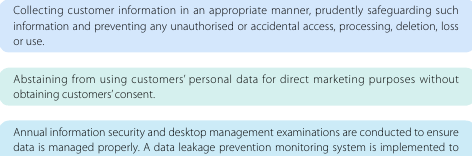


TABLE 1 :


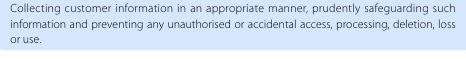


TABLE 2 :


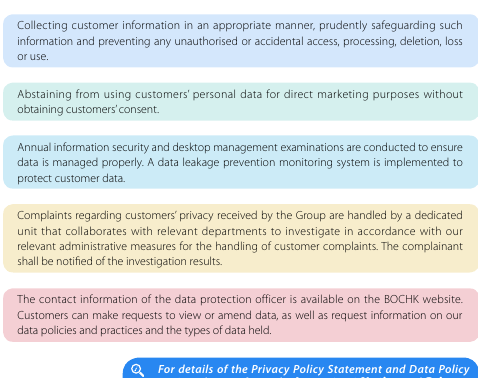


TABLE 3 :


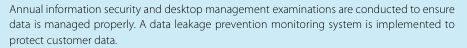


TABLE 4 :


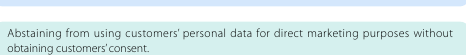


TABLE 0 :


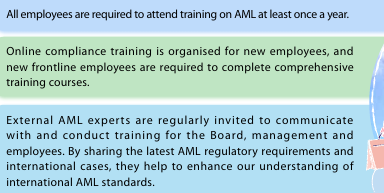


TABLE 0 :


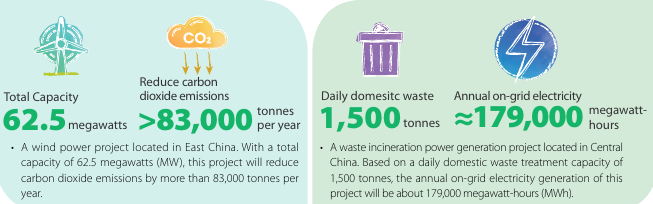


TABLE 0 :


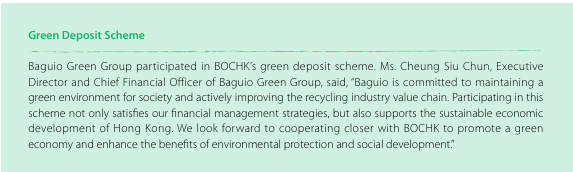


TABLE 1 :


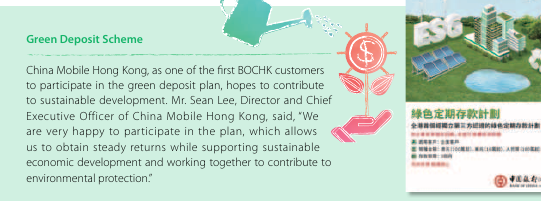


TABLE 0 :


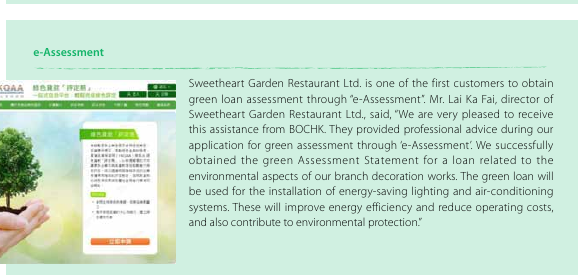


TABLE 1 :


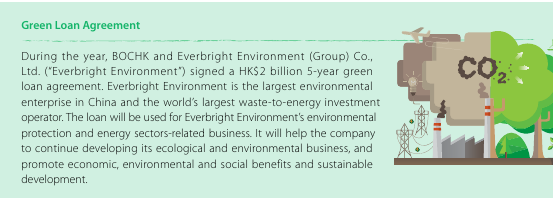


TABLE 0 :


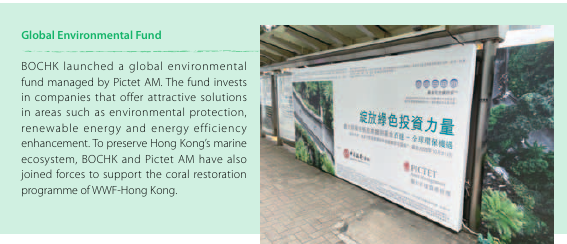


TABLE 1 :


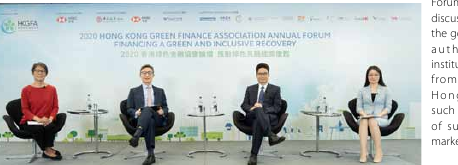


TABLE 2 :


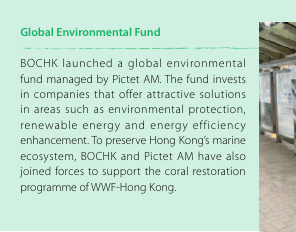


TABLE 0 :


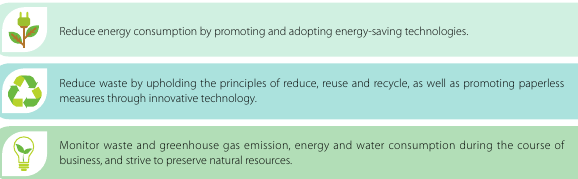


----------------------------------------------------------------------------------------------------------
RELEVANT IMAGE FOUND!


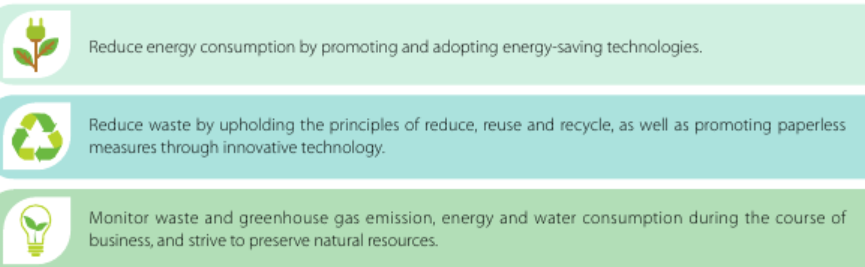

----------------------------------------------------------------------------------------------------------
TABLE 0 :


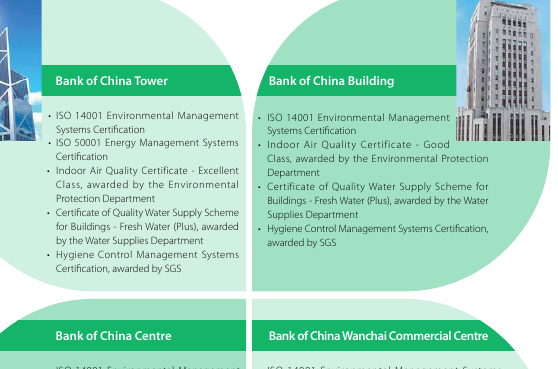


TABLE 0 :


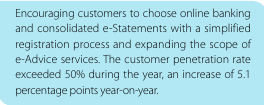


TABLE 1 :


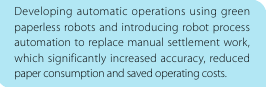


TABLE 2 :


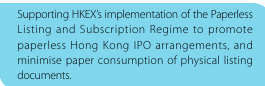


TABLE 3 :


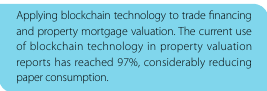


TABLE 4 :


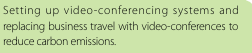


TABLE 0 :


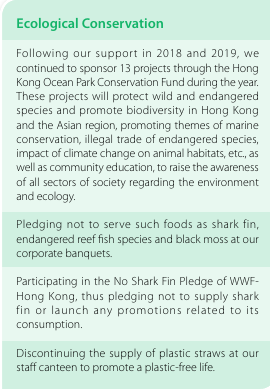


TABLE 1 :


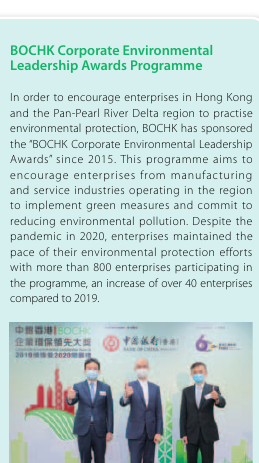


TABLE 0 :


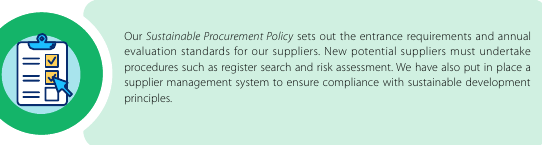


TABLE 1 :


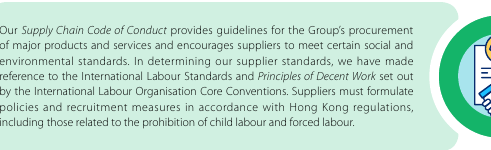


TABLE 2 :


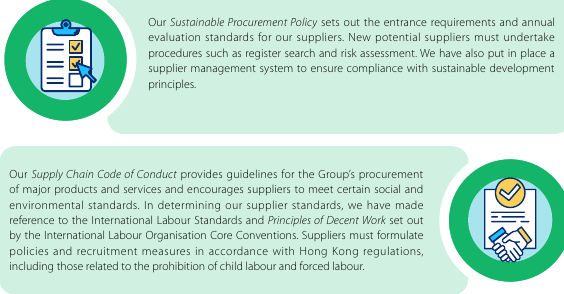


TABLE 0 :


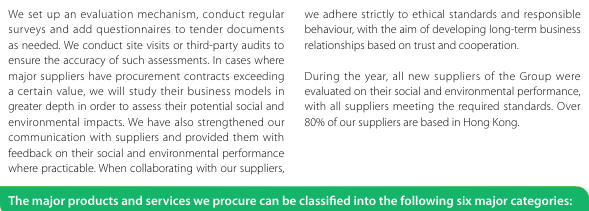


TABLE 0 :


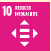


TABLE 1 :


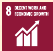


TABLE 2 :


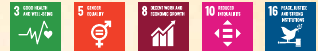


TABLE 0 :


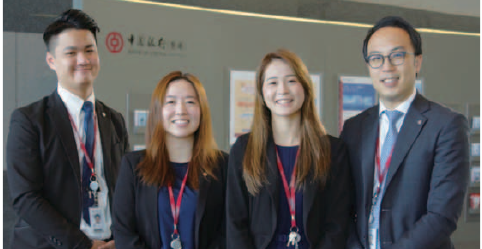


TABLE 0 :



TABLE 0 :


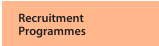


TABLE 1 :


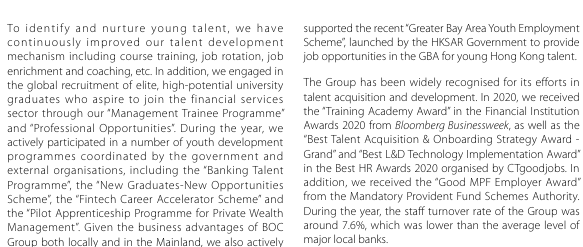


TABLE 2 :


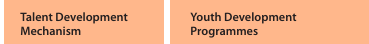


TABLE 0 :


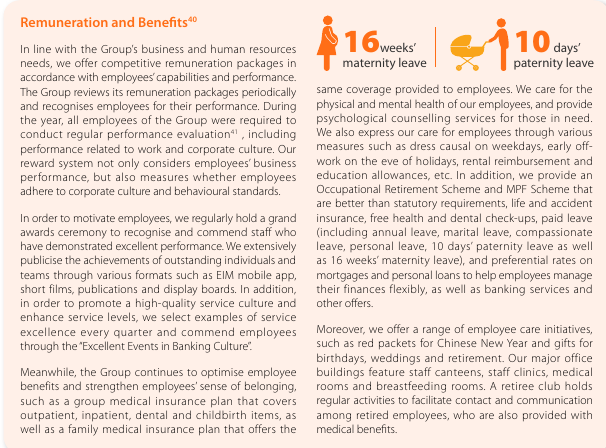


TABLE 0 :


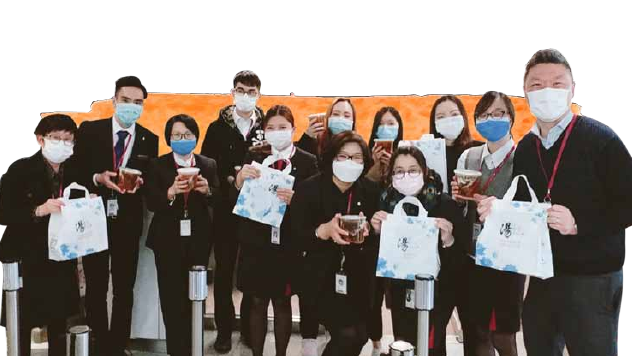


TABLE 0 :


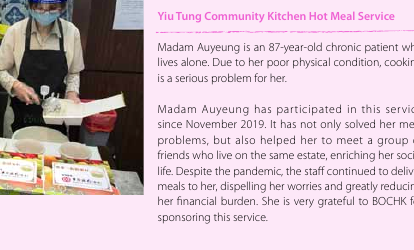


TABLE 0 :


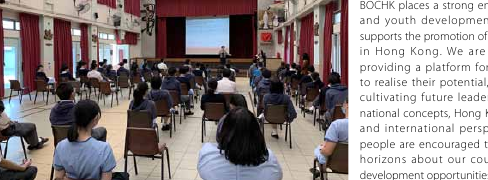


TABLE 0 :


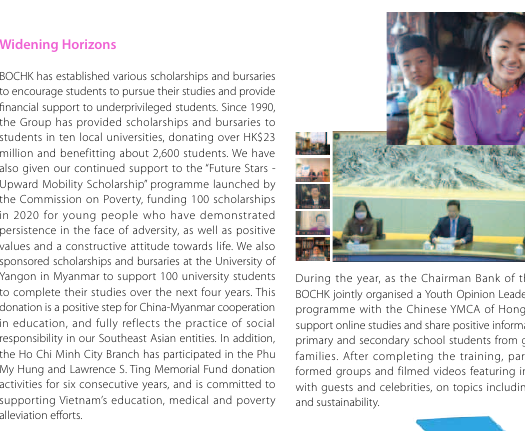


TABLE 0 :


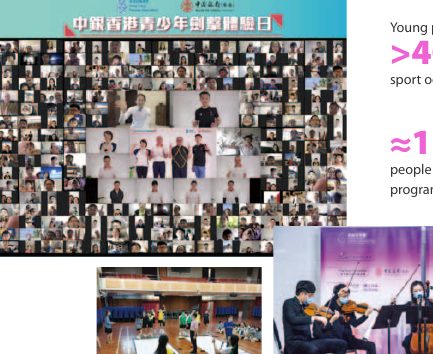


TABLE 0 :


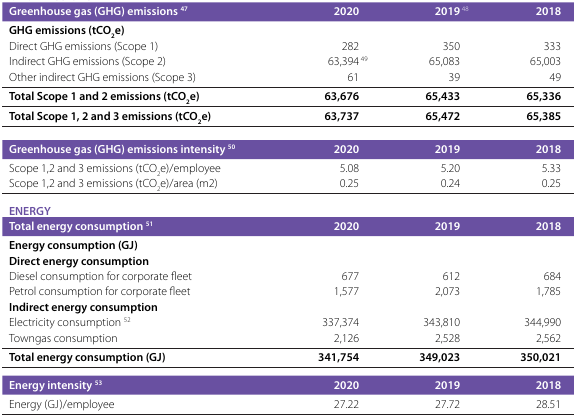


TABLE 1 :


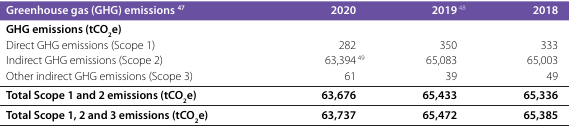


TABLE 2 :


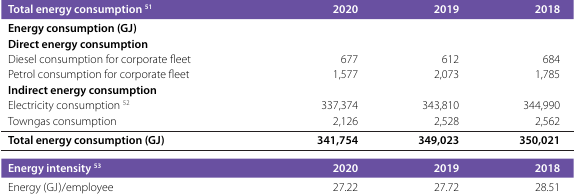


TABLE 3 :


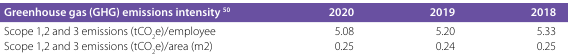


TABLE 4 :


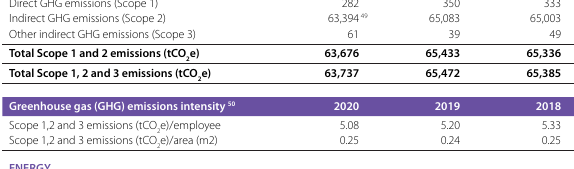


----------------------------------------------------------------------------------------------------------
RELEVANT IMAGE FOUND!


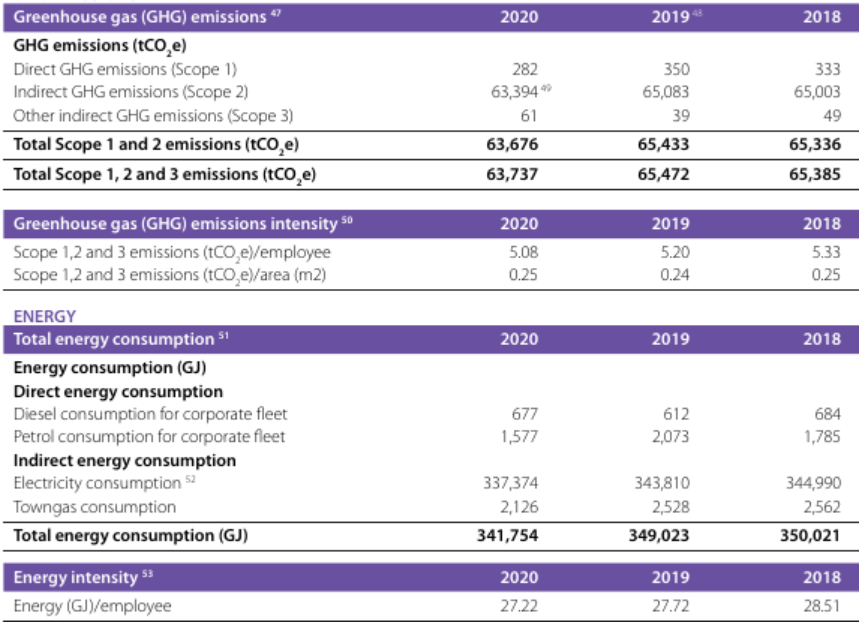

----------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------
RELEVANT IMAGE FOUND!


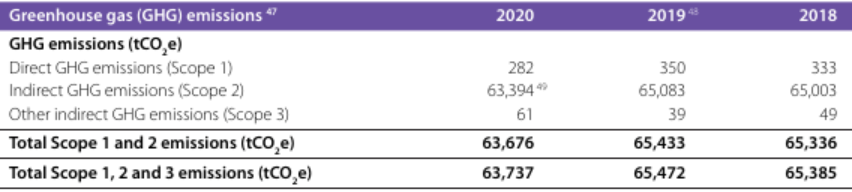

----------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------
RELEVANT IMAGE FOUND!


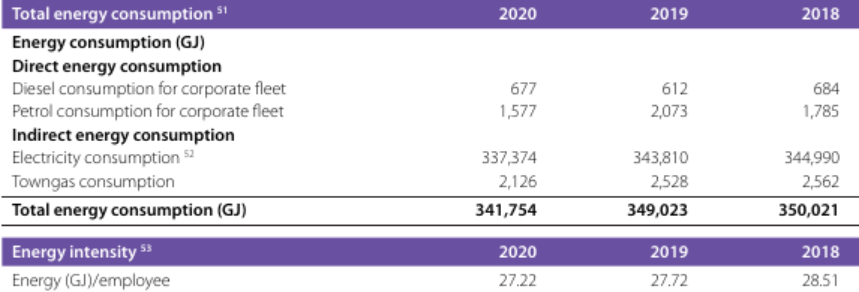

----------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------
RELEVANT IMAGE FOUND!


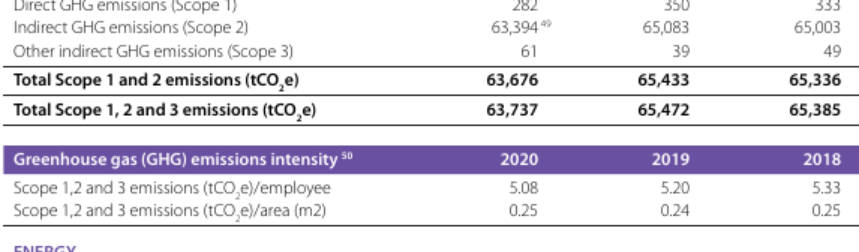

----------------------------------------------------------------------------------------------------------
TABLE 0 :


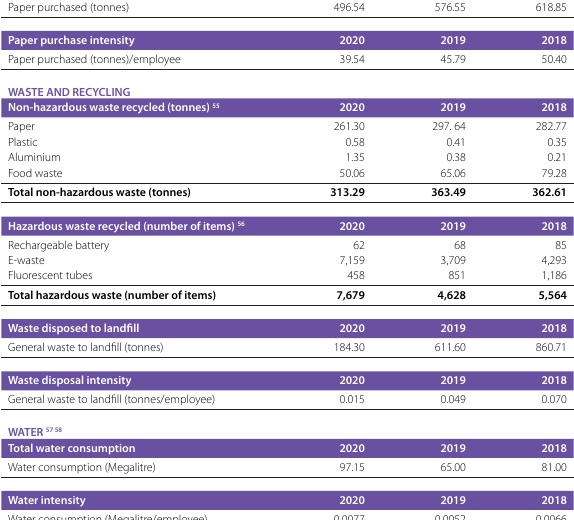


TABLE 1 :


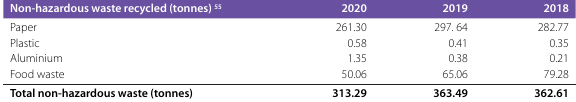


TABLE 2 :


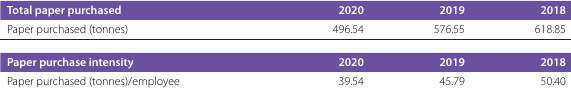


TABLE 3 :


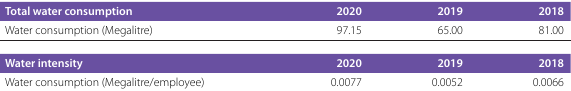


TABLE 4 :


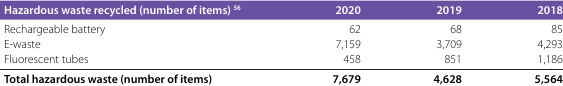


TABLE 5 :


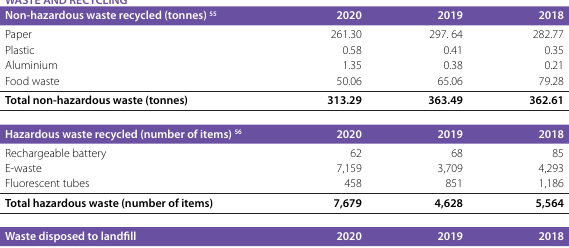


TABLE 6 :


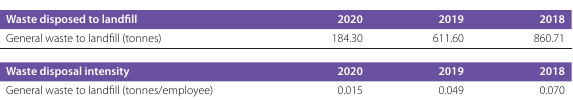


TABLE 7 :


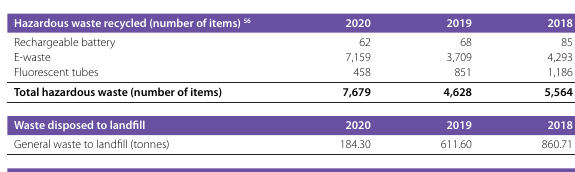


----------------------------------------------------------------------------------------------------------
RELEVANT IMAGE FOUND!


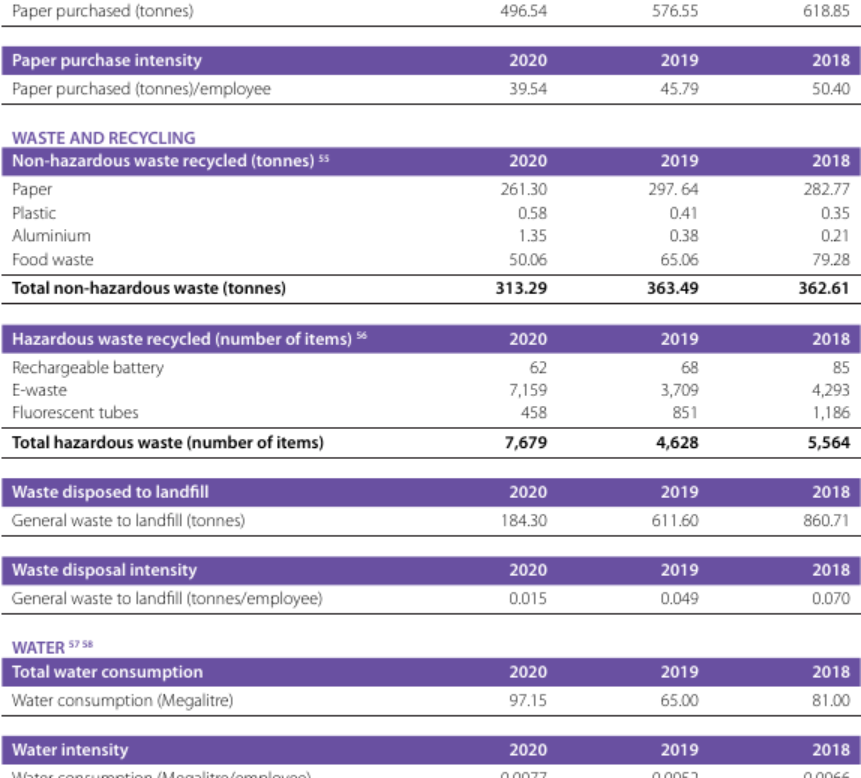

----------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------
RELEVANT IMAGE FOUND!


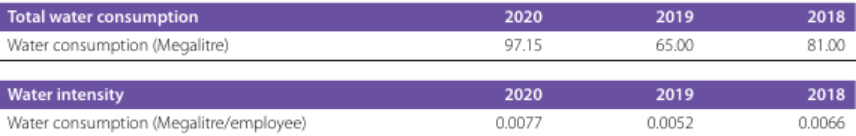

----------------------------------------------------------------------------------------------------------
TABLE 0 :


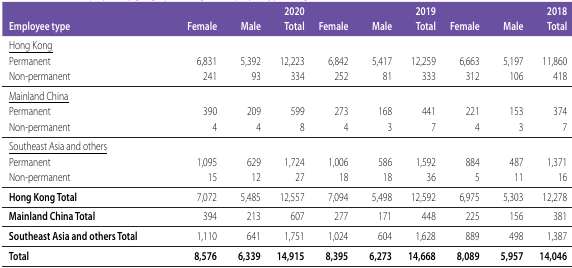


TABLE 1 :


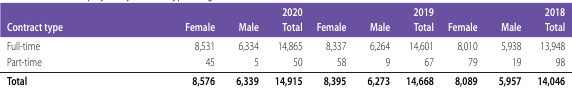


TABLE 0 :


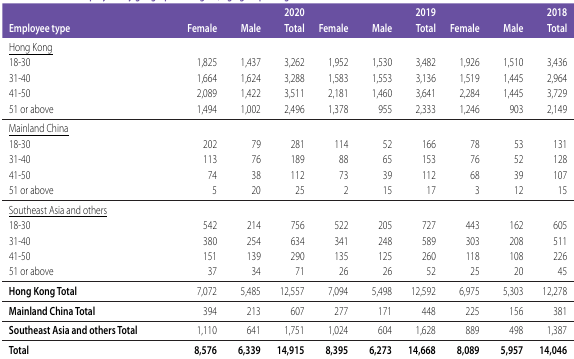


TABLE 1 :


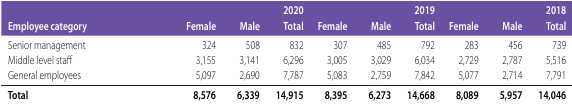


TABLE 0 :


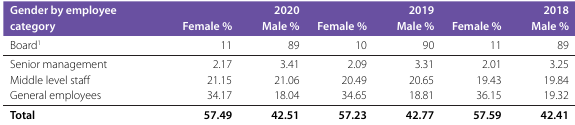


TABLE 1 :


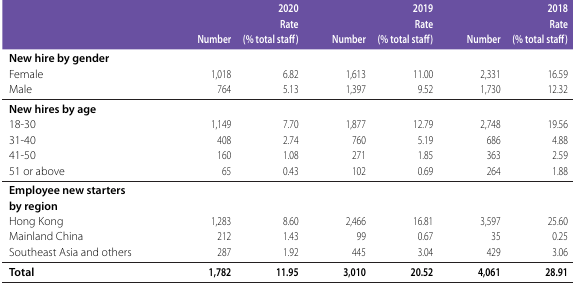


TABLE 2 :


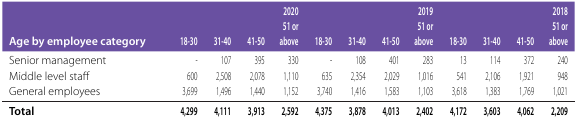


TABLE 3 :


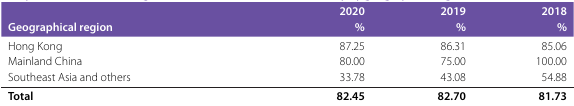


TABLE 4 :


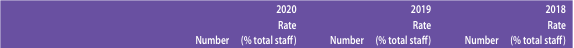


TABLE 0 :


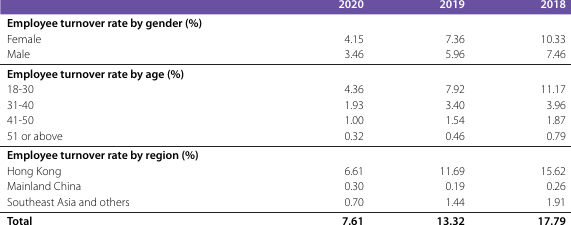


TABLE 1 :


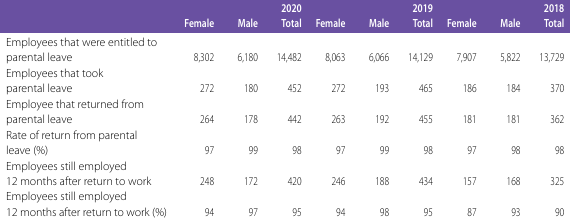


TABLE 2 :


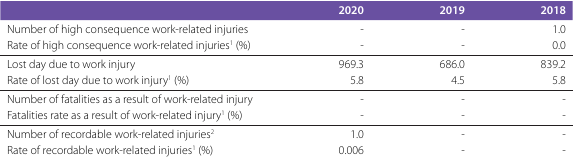


TABLE 3 :


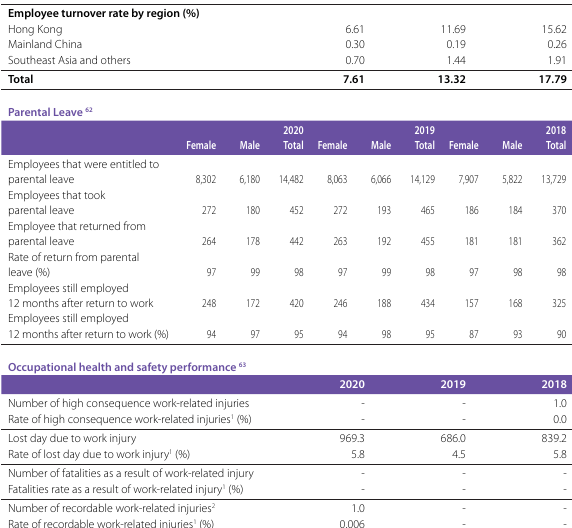


TABLE 0 :


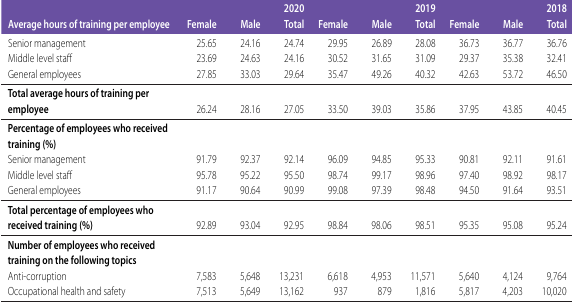


TABLE 1 :


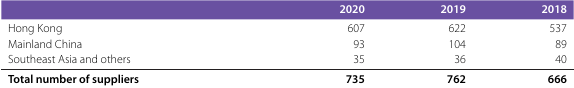


TABLE 2 :


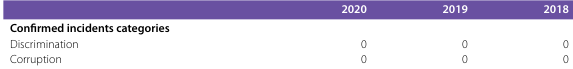


TABLE 0 :


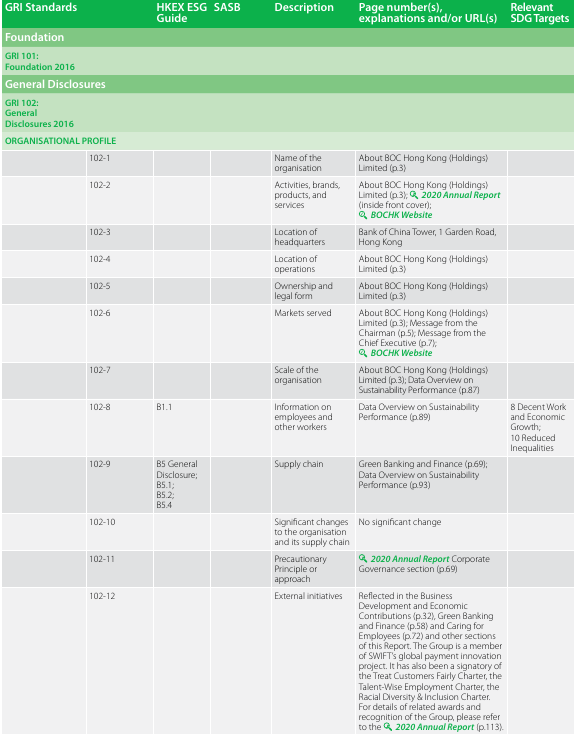


TABLE 0 :


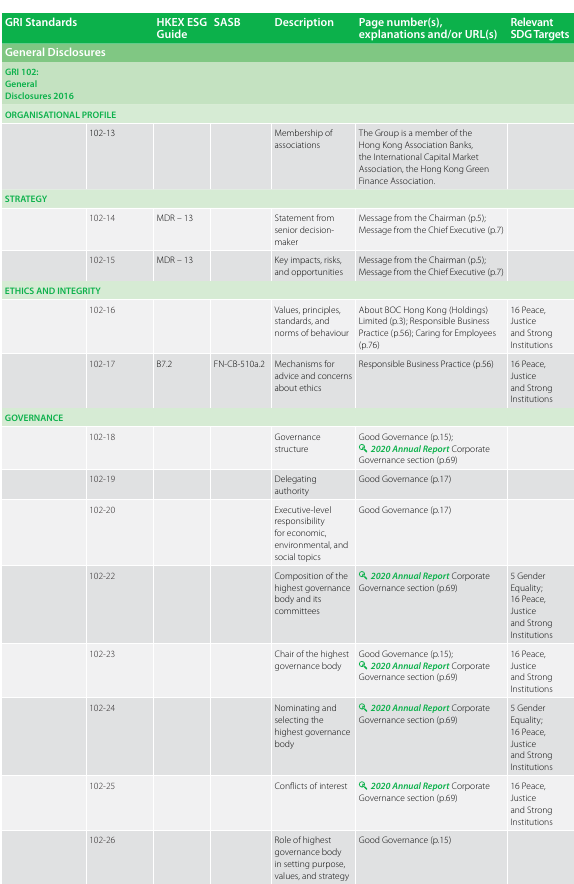


TABLE 0 :


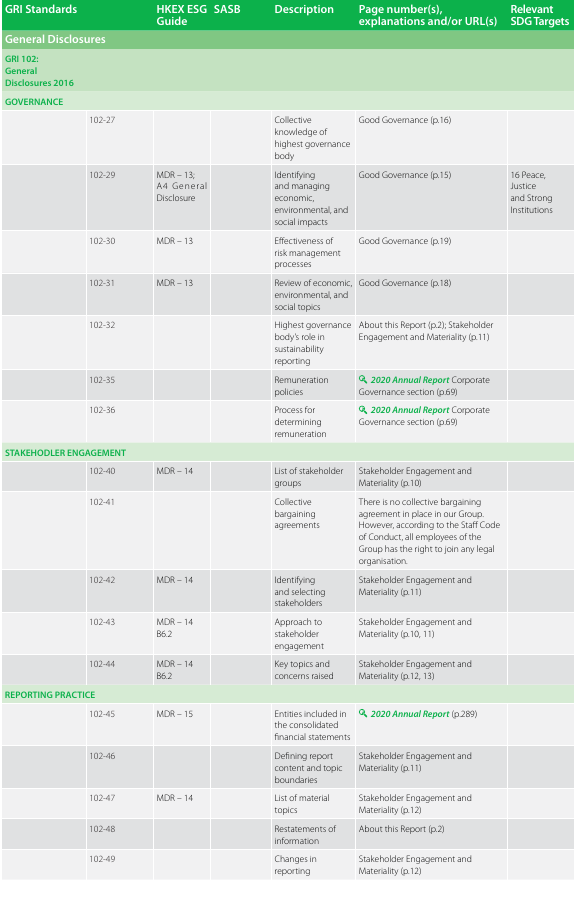


TABLE 0 :


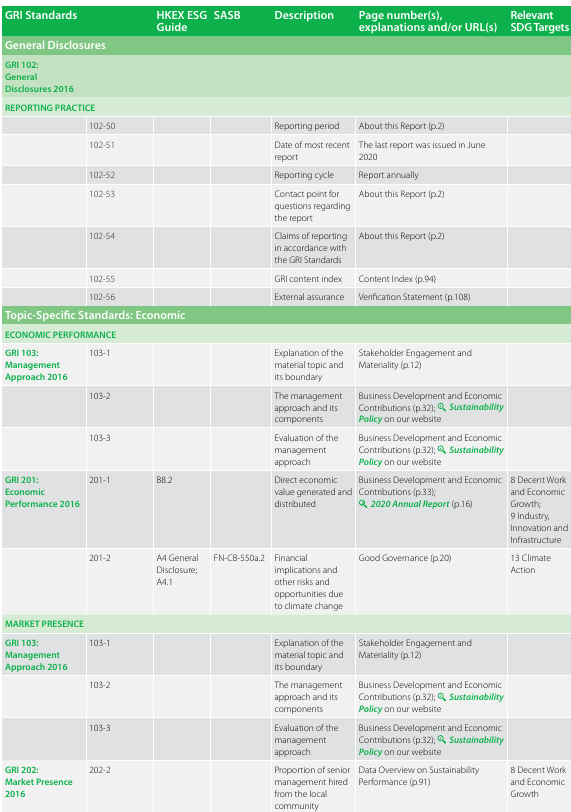


TABLE 1 :


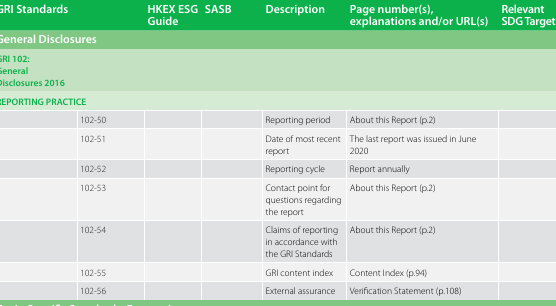


TABLE 2 :


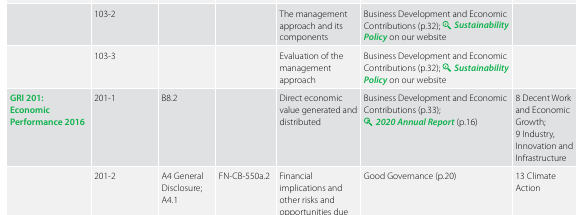


TABLE 0 :


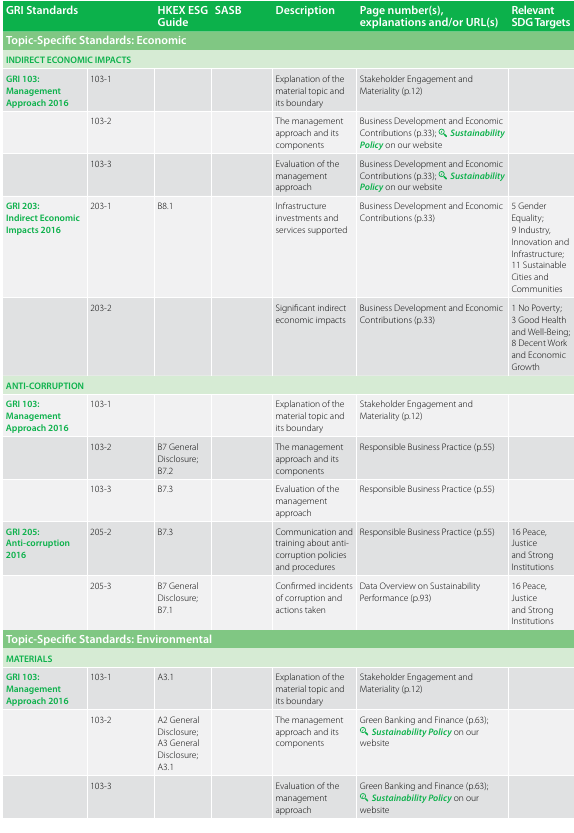


TABLE 1 :


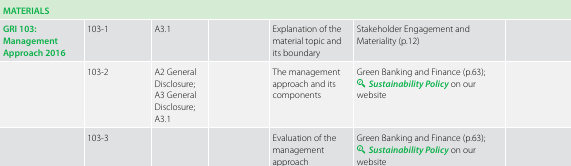


TABLE 2 :


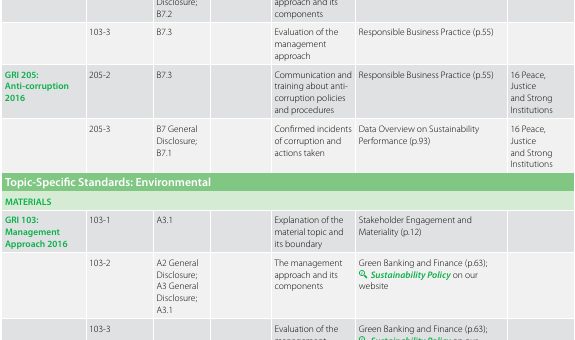


TABLE 0 :


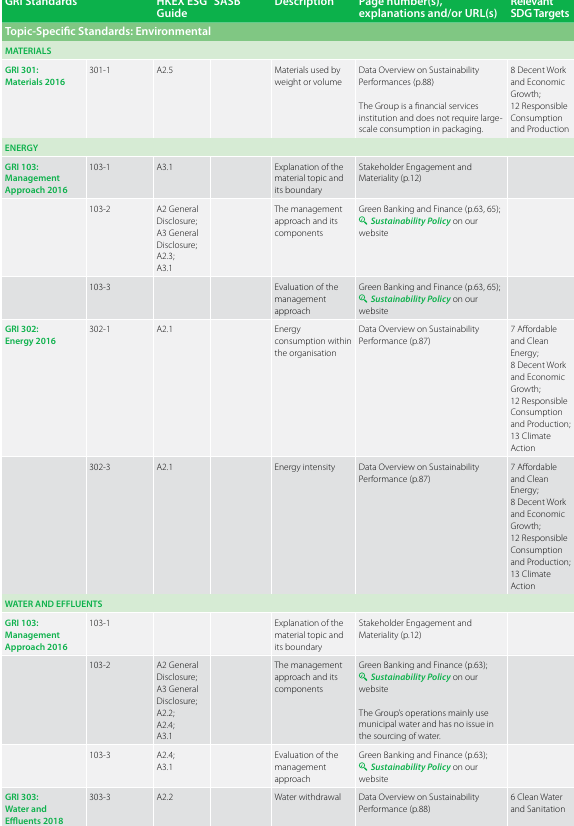


TABLE 0 :


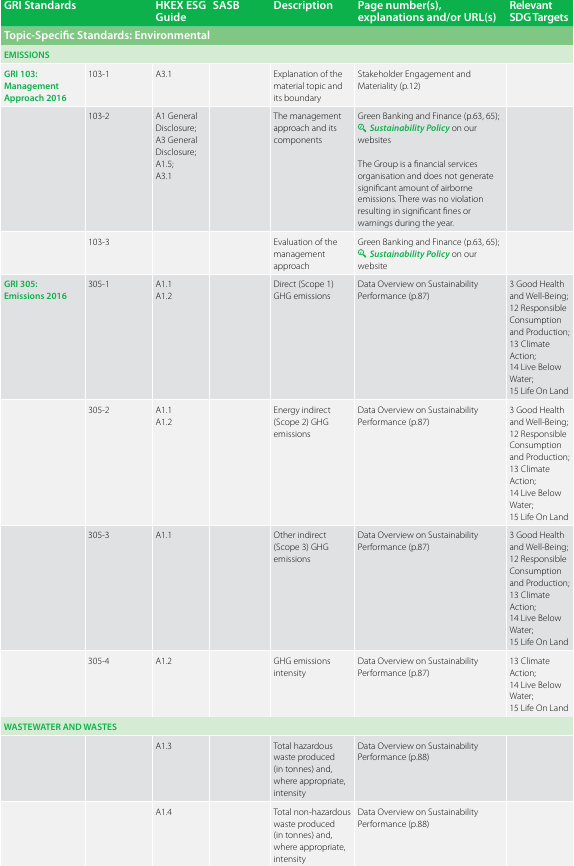


TABLE 1 :


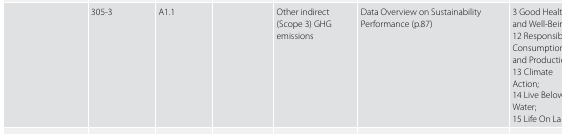


TABLE 2 :


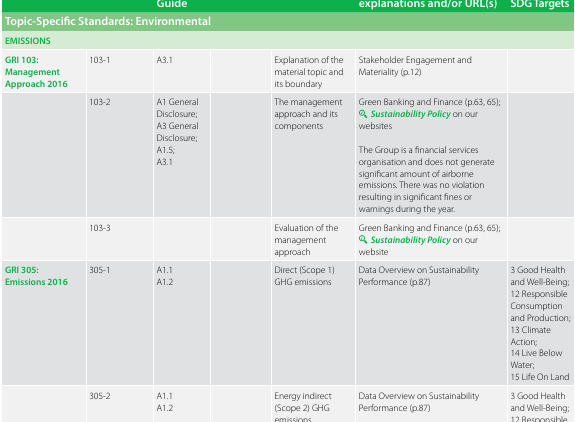


----------------------------------------------------------------------------------------------------------
RELEVANT IMAGE FOUND!


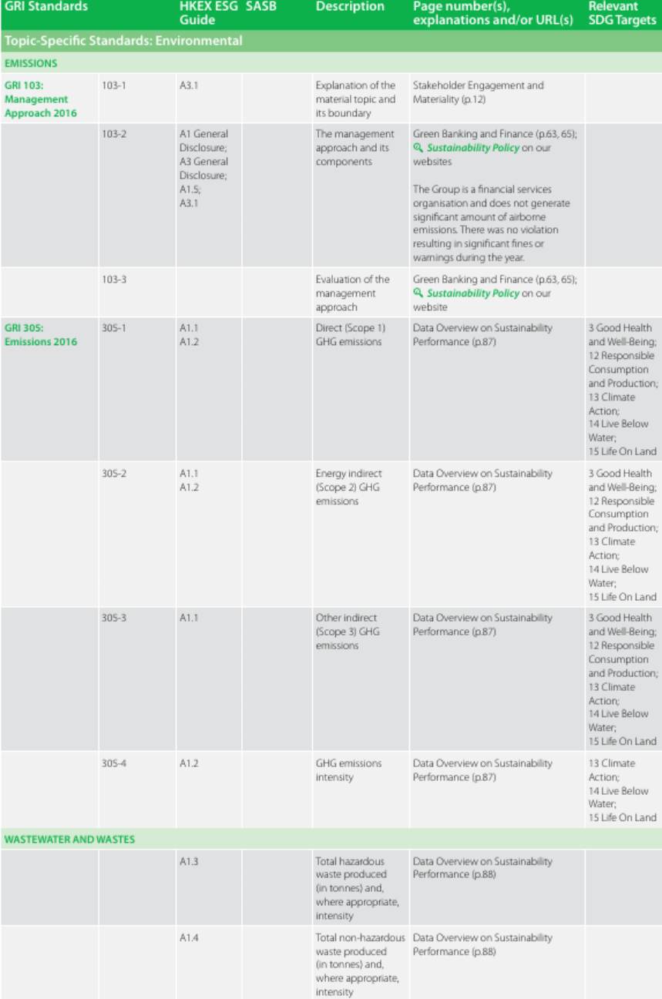

----------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------
RELEVANT IMAGE FOUND!


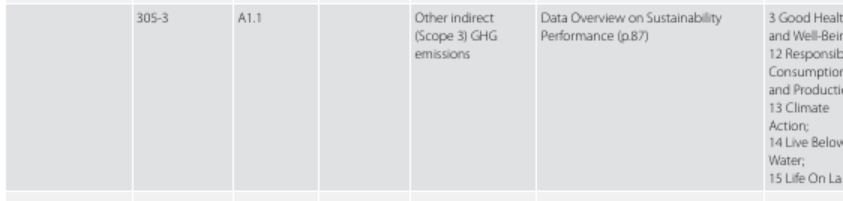

----------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------
RELEVANT IMAGE FOUND!


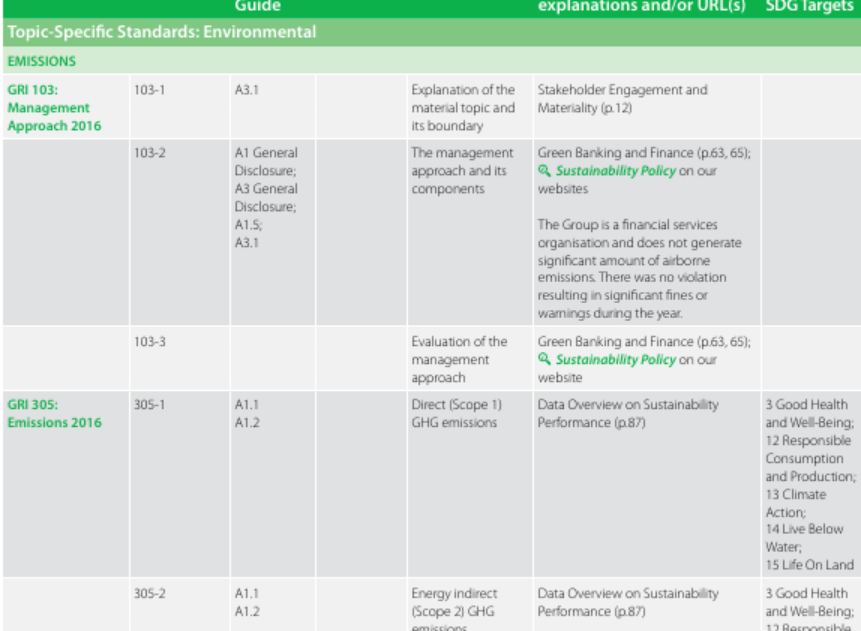

----------------------------------------------------------------------------------------------------------
TABLE 0 :


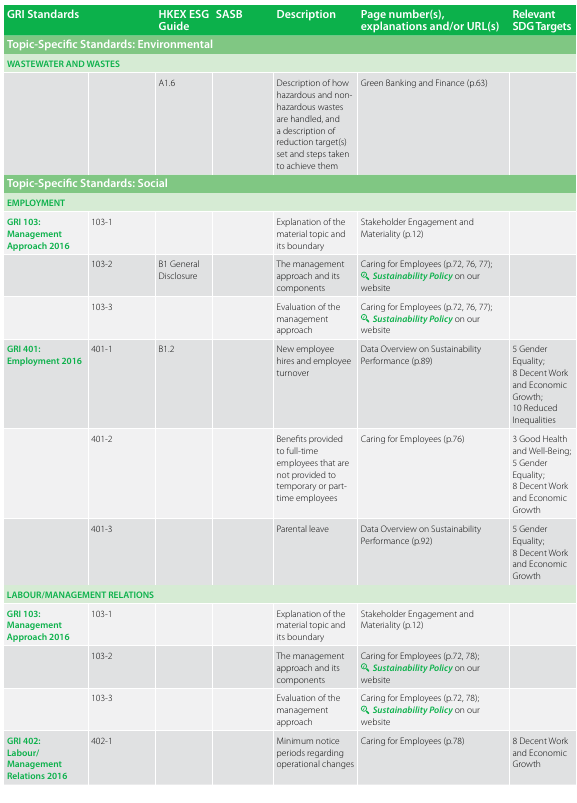


TABLE 1 :


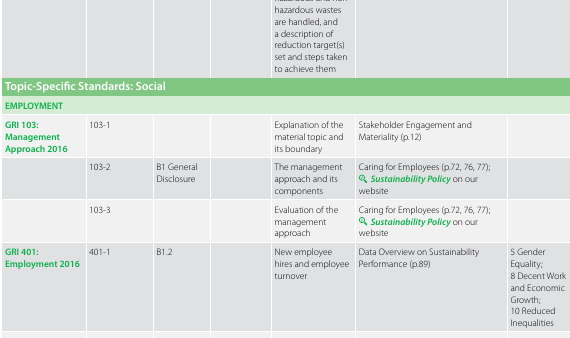


TABLE 2 :


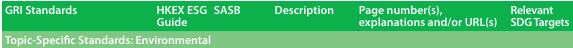


TABLE 3 :


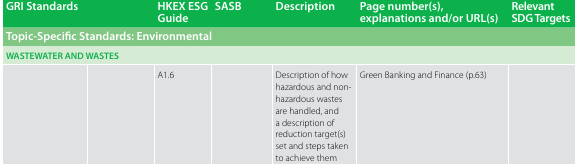


TABLE 4 :


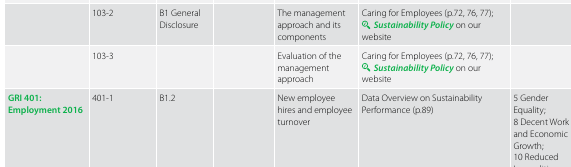


TABLE 0 :


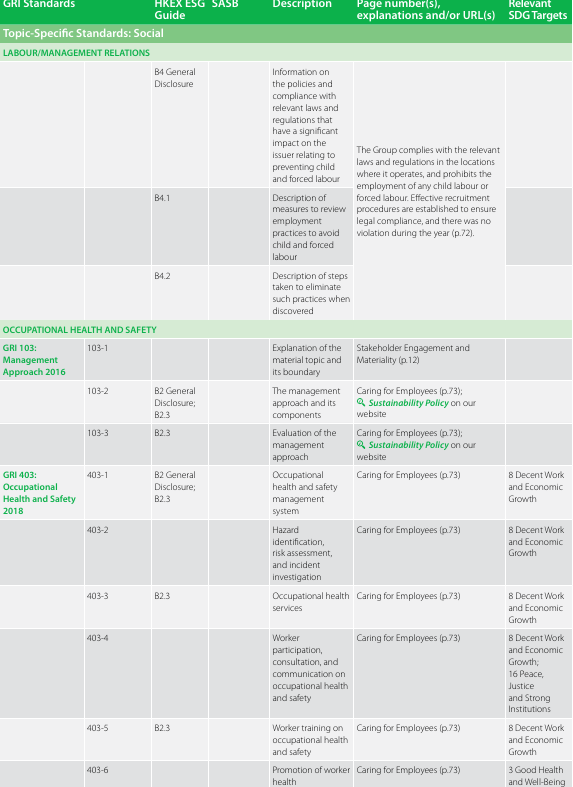


TABLE 1 :


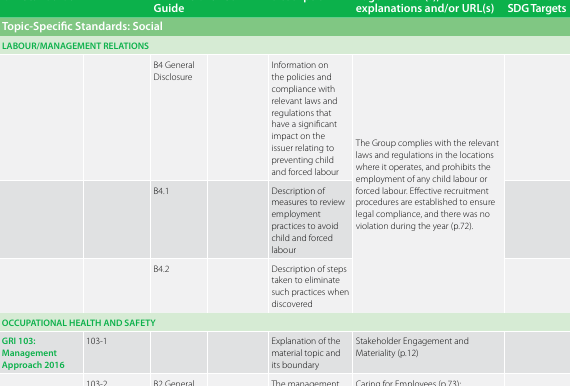


TABLE 0 :


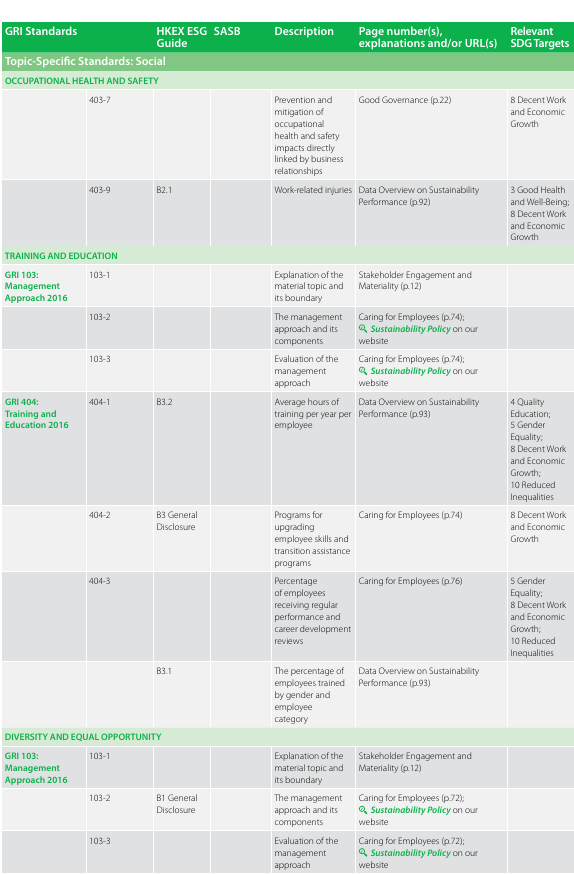


TABLE 1 :


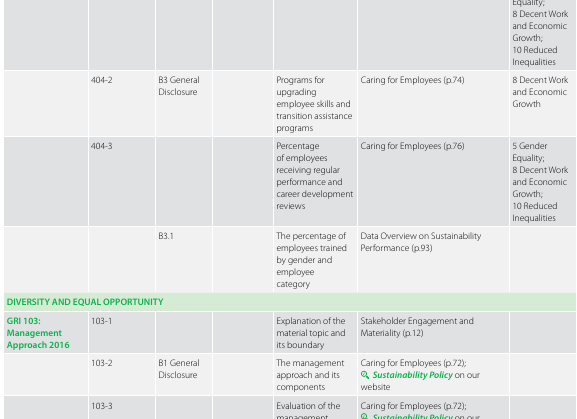


TABLE 0 :


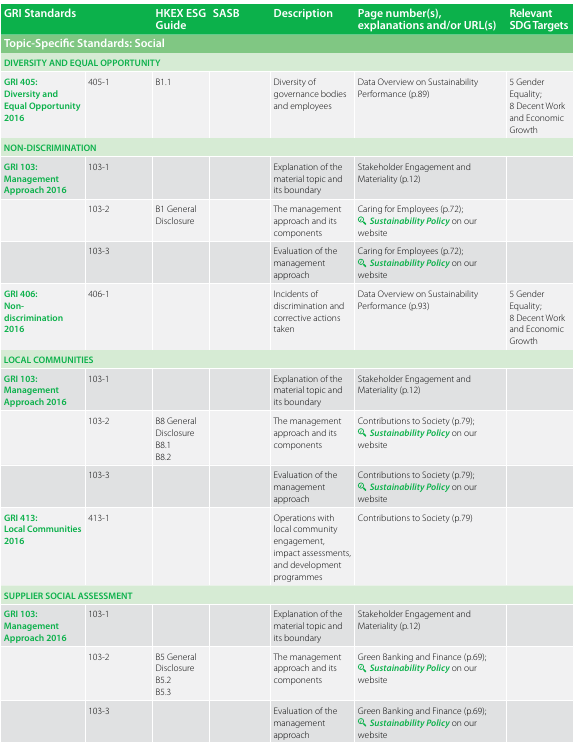


TABLE 0 :


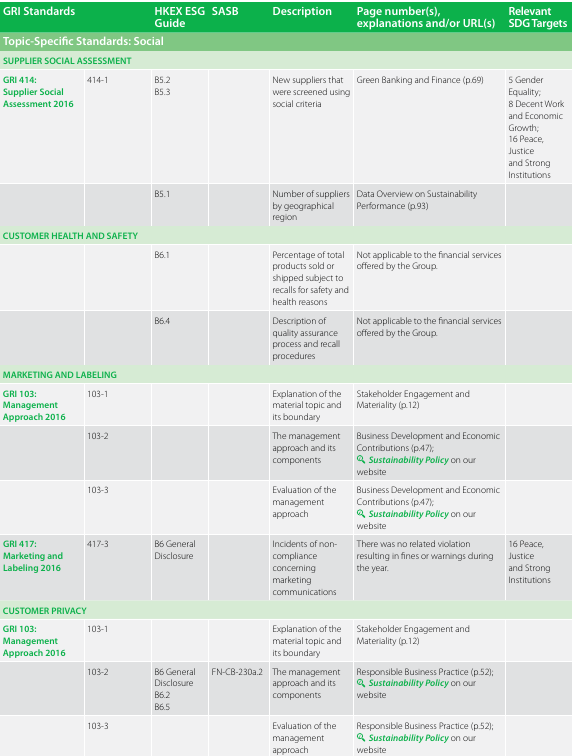


TABLE 0 :


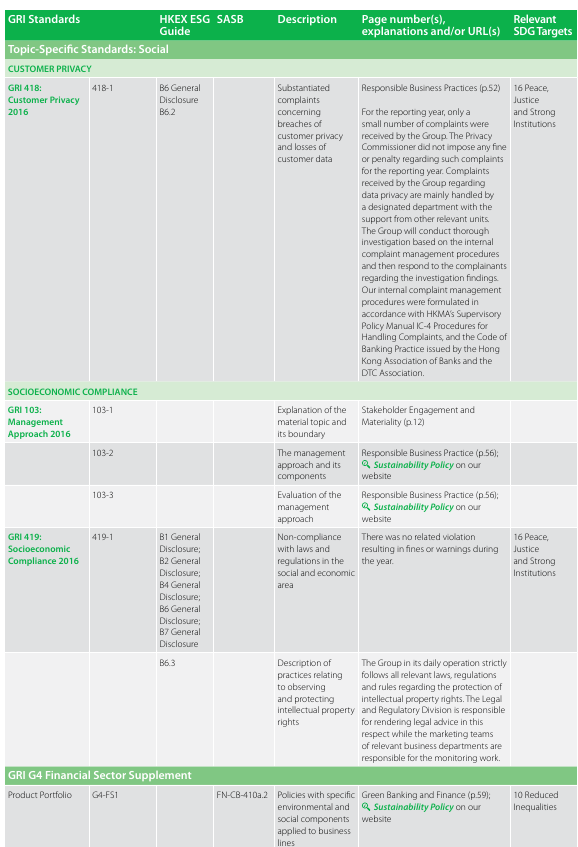


TABLE 1 :


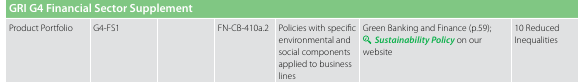


TABLE 2 :


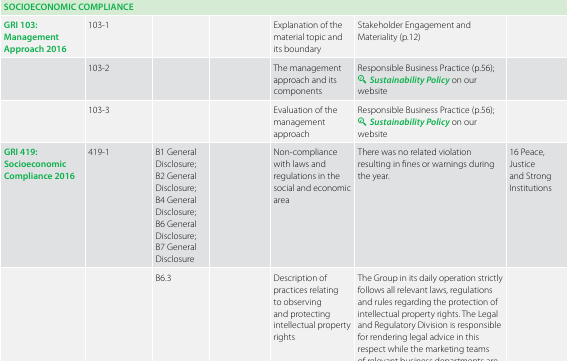


TABLE 3 :


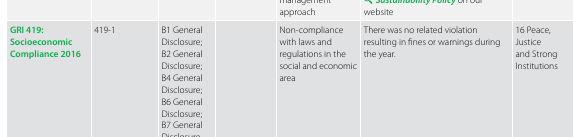


TABLE 0 :


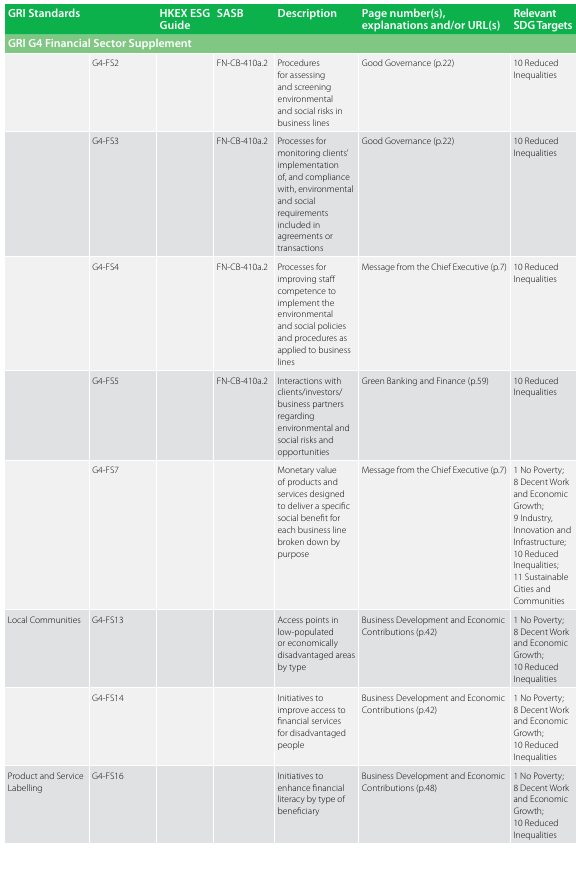


TABLE 1 :


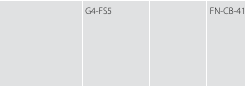


TABLE 2 :


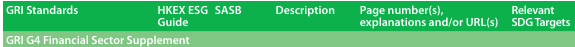


TABLE 3 :


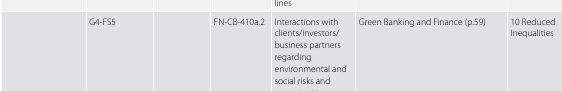

In [6]:
table_extraction("https://www.bochk.com/dam/bochk/desktop/top/aboutus/esg/report/SustainabilityReport2020_en.pdf", "/content/output_images/")

In [14]:
import shutil
shutil.make_archive('output_images', 'zip', 'output_images_chbank')

'/content/output_images.zip'